In [4]:
import pandas as pd
import seaborn as sns
import numpy as np
import sklearn
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler # Feature Scaling
from scipy import stats
from scipy.stats import norm, skew #for some statistics
import matplotlib.pyplot as plt
import math
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn import metrics

%matplotlib inline

'F' 'C' 'E' 'D' 'A' 'A#' 'C#' 'B' 'G' 'D#' 'G#' 'F#'
def convertPitchInt(strIn):
    if(type(strIn) == str):
        if(strIn == 'C'):
            return 0
        elif(strIn == 'C#'):
            return 1
        elif(strIn == 'D'):
            return 2
        elif(strIn == 'D#'):
            return 3
        elif(strIn == 'E'):
            return 4
        elif(strIn == 'F'):
            return 5
        elif(strIn == 'F#'):
            return 6
        elif(strIn == 'G'):
            return 7
        elif(strIn == 'G#'):
            return 8
        elif(strIn == 'A'):
            return 9
        elif(strIn == 'A#'):
            return 10
        elif(strIn == 'B'):
            return 11
    else:
        print("Enter here")
        return strIn  
#path = "/kaggle/input/2022-ntust-data-science-hw2/"
path = ""
df = pd.read_csv(path+"train.csv")
colNames = {'song_id':'song_id',
            'Feature 1':'Authenticity', #closer to 1 means less electronic, 
           'Feature 2':'Intensity', #higher = louder noise,
           'Feature 3':'SuitDance', #suit to dance? 1 closer, 0 no, 
           'Feature 4':'PlayTime', #the play time amt of song, indicate popularity, 
           'Feature 5':'BPM', #tempo in bpm, 
           'Feature 6':'Live', #the chance a song to be recorded in live, 
           'Feature 7':'Positivity', #the emotion conveyed by the song, with higher = positive, lower negative, 
           'Feature 8':'Duration', #duration in milliseconds, 
           'Feature 9':'Loudness', #loudness in dB, 
           'Feature 10':'Vocal', #whether there is vocal, with higher indicates there is vocal, 
           'Feature 11':'Key', #the key of the song, major = 0, minor = 1, 
           'Feature 12':'InstProportion', #proportion of the instrumental  
           'Feature 13':'Pitch', #pitch of the song
           }
df = df.rename(colNames, axis='columns')
print(df.describe(include="all"))

print ("=========")

#encode the strings to numbers


columnGroups = {
               'XAllDefault': ['Authenticity','Intensity','SuitDance','PlayTime', 
           'BPM', 'Live','Positivity','Duration','Loudness','Vocal','Key','InstProportion', 'Pitch'],
    
               'XNumericDefault':['Authenticity','Intensity','SuitDance','PlayTime', 
           'BPM', 'Live','Positivity','Duration','Loudness','Vocal','InstProportion'], # 12 columns
    
               'XCategoryDefault': ['Key','Pitch'], #1 columns
            
            'XAllDefaultNoLoudness':['Authenticity','Intensity','SuitDance','PlayTime', 
           'BPM', 'Live','Positivity','Duration','Vocal','Key','InstProportion', 'Pitch'],#loudness and intensity is similar, and loudness is more skewed, so remove it
    
            'XAllDefaultNoLoudnessAuthenticity':['Intensity','SuitDance','PlayTime', 
           'BPM', 'Live','Positivity','Duration','Vocal','Key','InstProportion', 'Pitch'], #Authenticity is quite similar, so also removeit
    
             'XAllDefaultNoLoudnessAuthenticityPitch':['Intensity','SuitDance','PlayTime', 
           'BPM', 'Live','Positivity','Duration','Vocal','Key','InstProportion'],
            
            'XAllDefaultNoLoudnessAuthenticityPitchNumericOnly':['Intensity','SuitDance','PlayTime', 
           'BPM', 'Live','Positivity','Duration','Vocal','InstProportion'],
    
            '1Only':['InstProportion'],
            
            '2Only':['PlayTime', 'BPM'],
            '1OnlyNew':['BPM'],
            #'3Only':['PlayTime', 'BPM',"InstProportion"],
            "NormalOnly":["SuitDance", "PlayTime", "BPM", "Positivity"],
            "NormalOnlyPlusInst":["SuitDance", "PlayTime", "BPM", "Positivity","InstProportion"],
            'PopularityOnly':["PlayTime"],
            'BasedOnMyOwnGuess':['Intensity','SuitDance','PlayTime', 
           'BPM', 'Positivity','Vocal','Key','Pitch'],
            "threeCombo":["SuitDance", "PlayTime", "Loudness"],
            "threeCombo2":["Duration", "Key", "InstProportion"],
            "3VarBest":["PlayTime", "Vocal", "InstProportion"],
            "4VarBest":["PlayTime", "Duration","Vocal", "InstProportion"]
    
}

test_df = pd.read_csv(path+"test_3000.csv")
col1 = test_df['col_1'].tolist()
col2 = test_df['col_2'].tolist()
appearOnTest = [0 for i in range(len(df))]
idxSets = set()
for i in range(len(test_df)):
    appearOnTest[col1[i]]=1
    idxSets.add(col1[i])
    appearOnTest[col2[i]]=1
    idxSets.add(col2[i])

             song_id  Authenticity     Intensity     SuitDance      PlayTime  \
count   40114.000000  40114.000000  40114.000000  40114.000000  40114.000000   
unique           NaN           NaN           NaN           NaN           NaN   
top              NaN           NaN           NaN           NaN           NaN   
freq             NaN           NaN           NaN           NaN           NaN   
mean    20056.500000      0.306247      0.599714      0.559131     44.464302   
std     11580.058686      0.340959      0.264198      0.178867     15.477318   
min         0.000000      0.000000      0.000792      0.059600      0.000000   
25%     10028.250000      0.020200      0.433000      0.443000     34.000000   
50%     20056.500000      0.145000      0.642000      0.570000     45.000000   
75%     30084.750000      0.550000      0.815000      0.688000     56.000000   
max     40113.000000      0.996000      0.999000      0.986000     99.000000   

                 BPM          Live    P

In [5]:
#view cardinality
for var in columnGroups["XCategoryDefault"]:
    print(var, ' contains ', len(df[var].unique()), ' labels')
    print(df[var].unique())
#all pitch exist

Key  contains  2  labels
[1 0]
Pitch  contains  12  labels
['F' 'C' 'E' 'D' 'A' 'A#' 'C#' 'B' 'G' 'D#' 'G#' 'F#']


In [6]:
#Count how many empty values, in percentage
df.isnull().mean() * 100
#how nice, no nulll

song_id           0.0
Authenticity      0.0
Intensity         0.0
SuitDance         0.0
PlayTime          0.0
BPM               0.0
Live              0.0
Positivity        0.0
Duration          0.0
Loudness          0.0
Vocal             0.0
Key               0.0
InstProportion    0.0
Pitch             0.0
dtype: float64

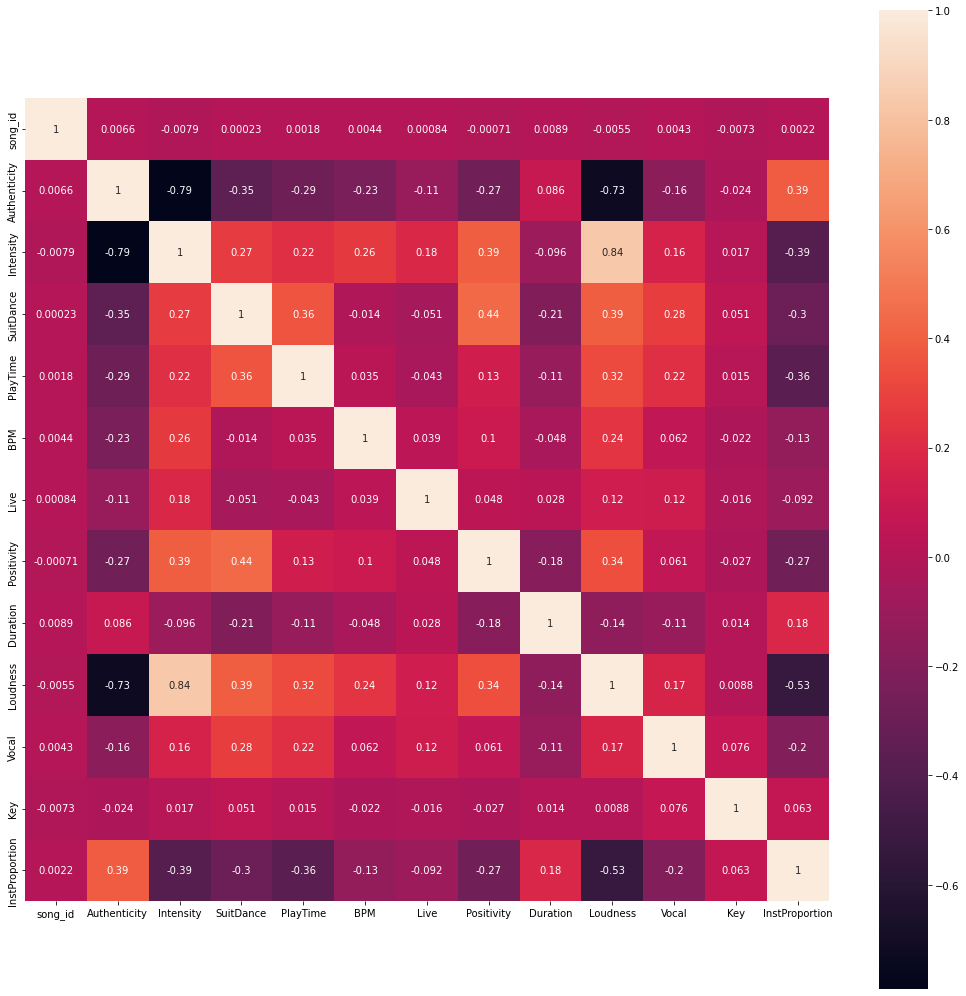

In [7]:
correlation = df.corr()
plt.figure(figsize=(18,18))
sns.heatmap(correlation, annot=True, square=True)
plt.show()

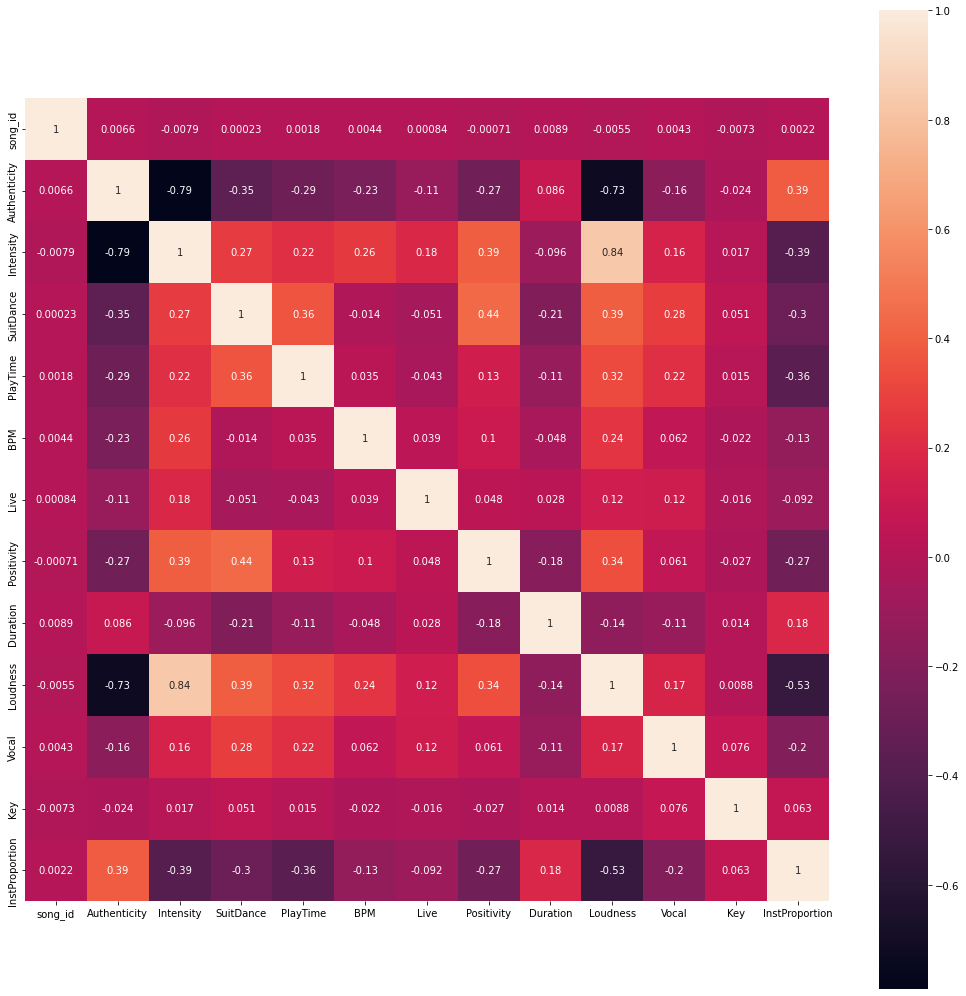

In [8]:
#apply StandardScaler to test correlation differences
tempdf = df.copy()
tempdf[columnGroups['XNumericDefault']] = StandardScaler().fit_transform(tempdf[columnGroups['XNumericDefault']])
correlation = tempdf.corr()
plt.figure(figsize=(18,18))
sns.heatmap(correlation, annot=True, square=True)
plt.show()

Pitch


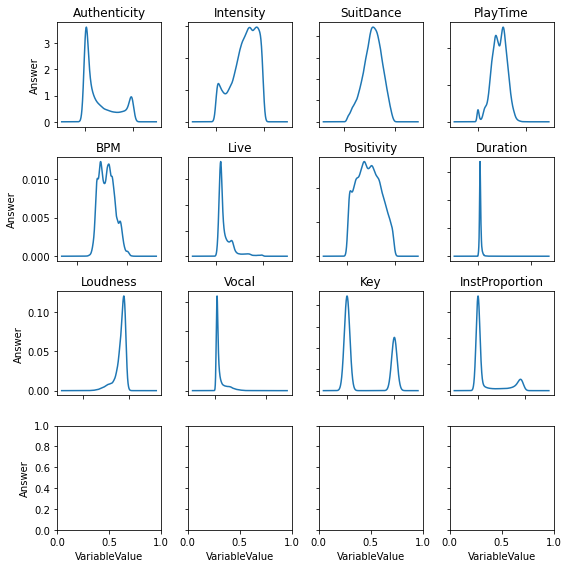

In [15]:
#plot graph
plt.rcParams["figure.figsize"] = [8.00, 8.00]
plt.rcParams["figure.autolayout"] = True
rowCol = math.ceil(math.sqrt(len(columnGroups['XAllDefault'])))
fig, axs = plt.subplots(rowCol, rowCol)
for i in range(len(columnGroups['XAllDefault'])):
    try:
        df[columnGroups['XAllDefault'][i]].plot(kind = "kde", ax = axs[i//rowCol, i%rowCol])
        axs[i//rowCol, i%rowCol].set_title(columnGroups['XAllDefault'][i])
    except TypeError:
        print(columnGroups['XAllDefault'][i])
for ax in axs.flat:
    ax.set(xlabel='VariableValue', ylabel='Answer')

# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()

#We can see that some of the graph is really skewed

Pitch


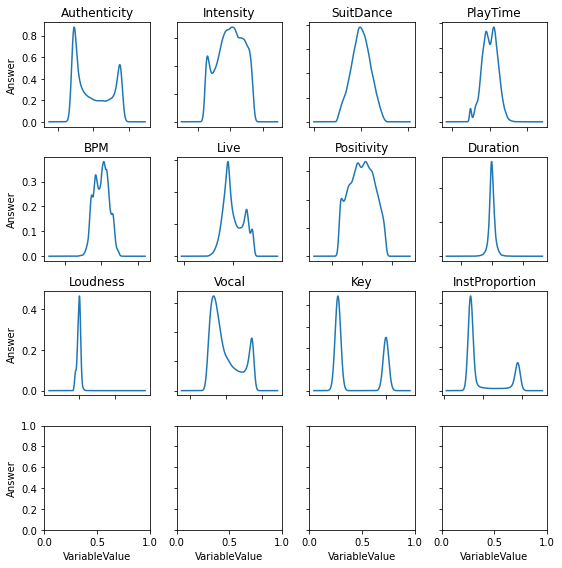

In [16]:
#try seeing effect of power transform
from sklearn.preprocessing import PowerTransformer
#plot graph
plt.rcParams["figure.figsize"] = [8.00, 8.00]
plt.rcParams["figure.autolayout"] = True

tempdf = df.copy()
tempdf[columnGroups['XNumericDefault']] = PowerTransformer().fit_transform(tempdf[columnGroups['XNumericDefault']])

rowCol = math.ceil(math.sqrt(len(columnGroups['XAllDefault'])))
fig, axs = plt.subplots(rowCol, rowCol)
for i in range(len(columnGroups['XAllDefault'])):
    try:
        tempdf[columnGroups['XAllDefault'][i]].plot(kind = "kde", ax = axs[i//rowCol, i%rowCol])
        axs[i//rowCol, i%rowCol].set_title(columnGroups['XAllDefault'][i])
    except TypeError:
        print(columnGroups['XAllDefault'][i])
    except:
        print(columnGroups['XAllDefault'][i])
for ax in axs.flat:
    ax.set(xlabel='VariableValue', ylabel='Answer')

# Hide x labels and tick labels for top plots and y ticks for right plots.
for ax in axs.flat:
    ax.label_outer()

#We can see that some of the graph is really skewed

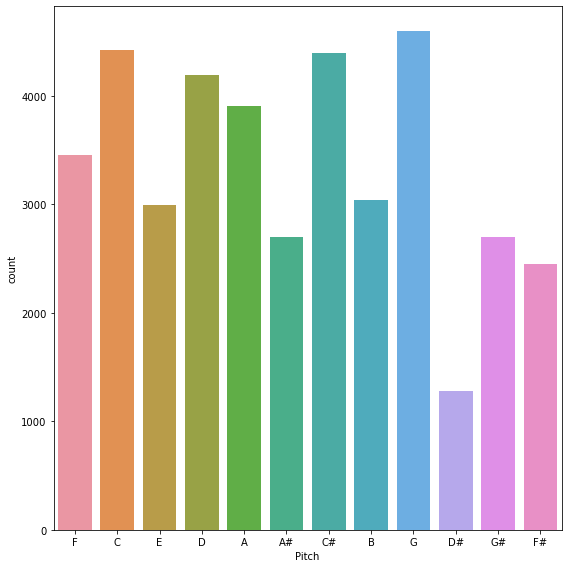

In [17]:
sns.countplot(x ='Pitch', data = df)
 
# Show the plot
plt.show()

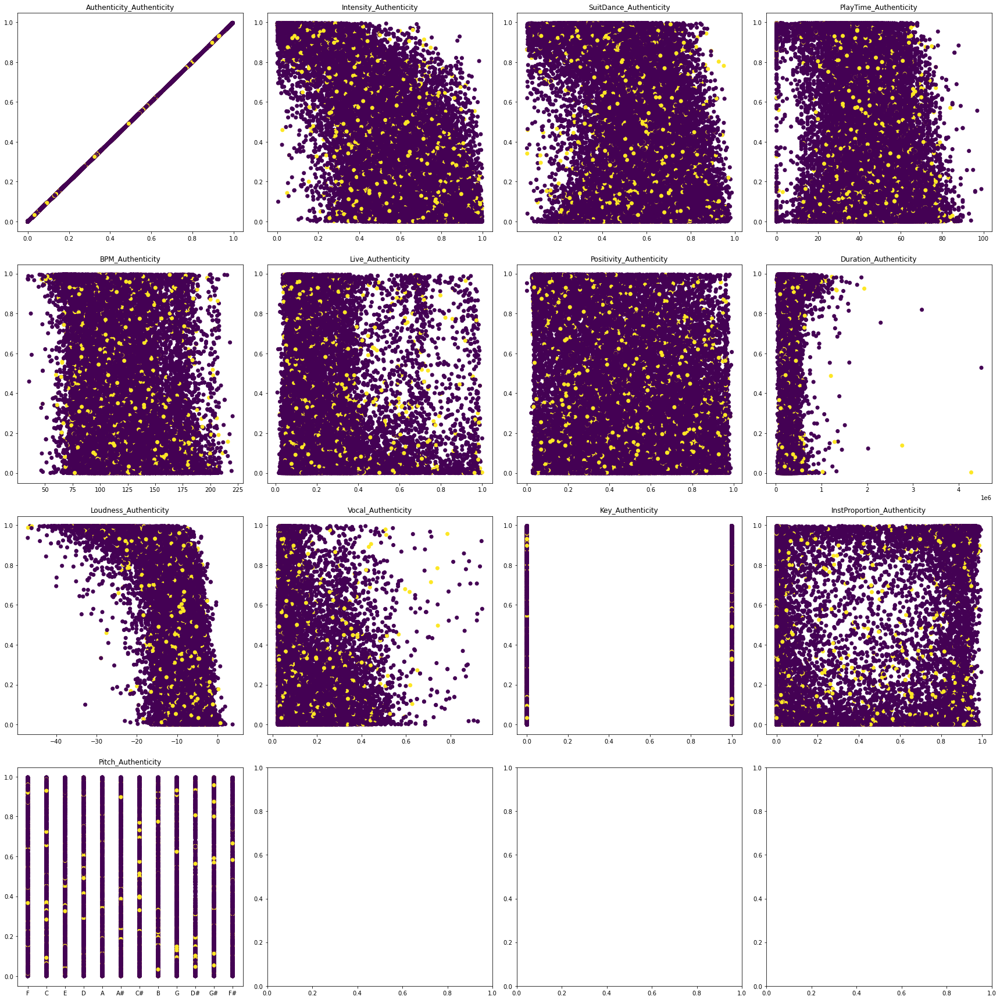

In [18]:
#plot graph
current = 0
plt.rcParams["figure.figsize"] = [24.00, 24.00]
plt.rcParams["figure.autolayout"] = True
rowCol = math.ceil(math.sqrt(len(columnGroups['XAllDefault'])))
fig, axs = plt.subplots(rowCol, rowCol)
#yellow = appear
for i in range(len(columnGroups['XAllDefault'])):
    try:
        axs[i//rowCol][i%rowCol].scatter(df[columnGroups['XAllDefault'][i]], df[columnGroups['XAllDefault'][current]], c = appearOnTest)
        axs[i//rowCol, i%rowCol].set_title(columnGroups['XAllDefault'][i] + "_"+columnGroups['XAllDefault'][current])
    except TypeError:
        print(columnGroups['XAllDefault'][i])

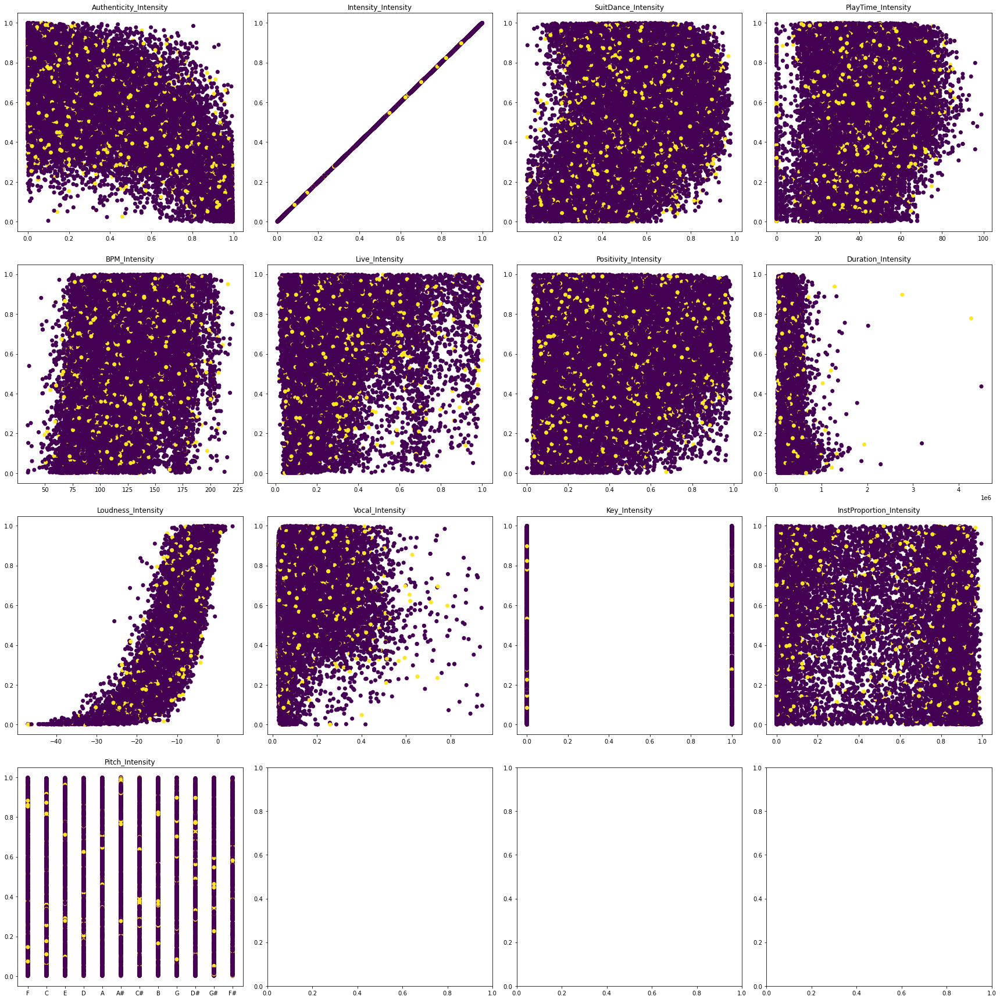

In [19]:
#plot graph
current = 1
plt.rcParams["figure.figsize"] = [24.00, 24.00]
plt.rcParams["figure.autolayout"] = True
rowCol = math.ceil(math.sqrt(len(columnGroups['XAllDefault'])))
fig, axs = plt.subplots(rowCol, rowCol)
#yellow = appear
for i in range(len(columnGroups['XAllDefault'])):
    try:
        axs[i//rowCol][i%rowCol].scatter(df[columnGroups['XAllDefault'][i]], df[columnGroups['XAllDefault'][current]], c = appearOnTest)
        axs[i//rowCol, i%rowCol].set_title(columnGroups['XAllDefault'][i] + "_"+columnGroups['XAllDefault'][current])
    except TypeError:
        print(columnGroups['XAllDefault'][i])

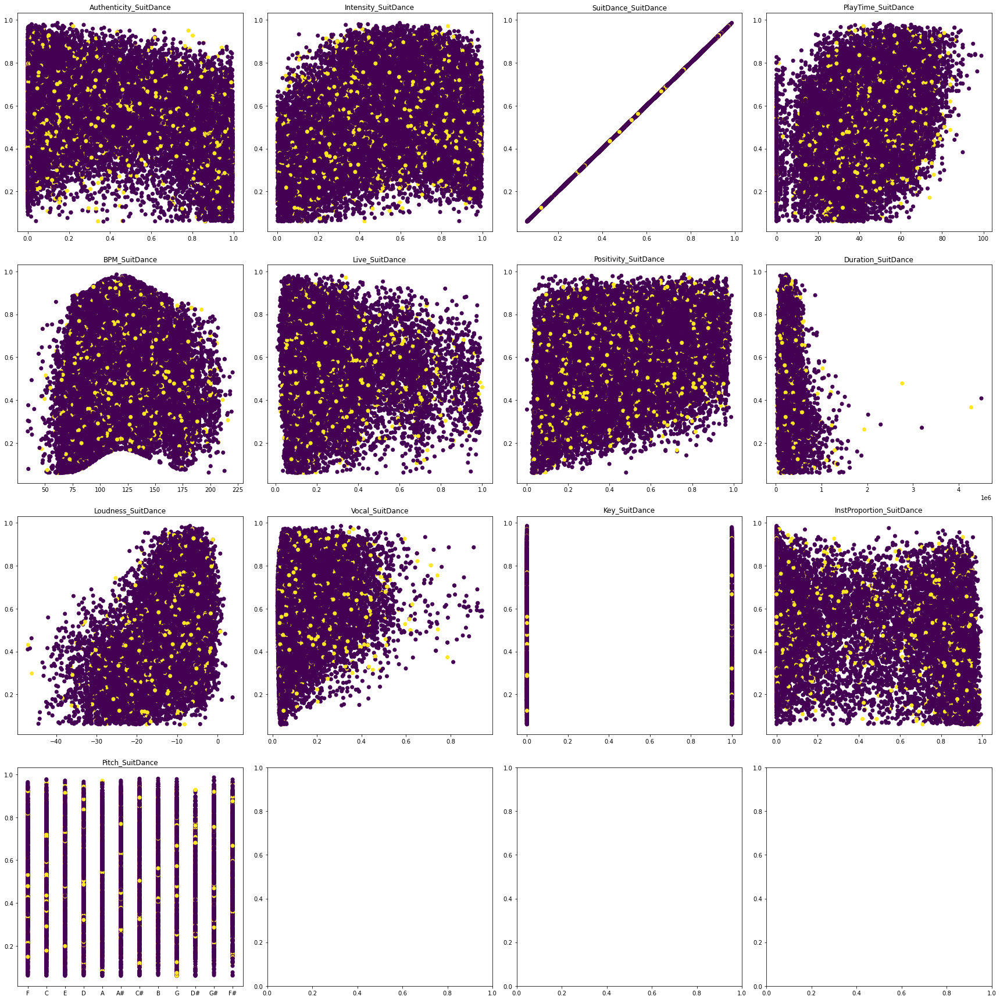

In [20]:
#plot graph
current = 2
plt.rcParams["figure.figsize"] = [24.00, 24.00]
plt.rcParams["figure.autolayout"] = True
rowCol = math.ceil(math.sqrt(len(columnGroups['XAllDefault'])))
fig, axs = plt.subplots(rowCol, rowCol)
#yellow = appear
for i in range(len(columnGroups['XAllDefault'])):
    try:
        axs[i//rowCol][i%rowCol].scatter(df[columnGroups['XAllDefault'][i]], df[columnGroups['XAllDefault'][current]], c = appearOnTest)
        axs[i//rowCol, i%rowCol].set_title(columnGroups['XAllDefault'][i] + "_"+columnGroups['XAllDefault'][current])
    except TypeError:
        print(columnGroups['XAllDefault'][i])

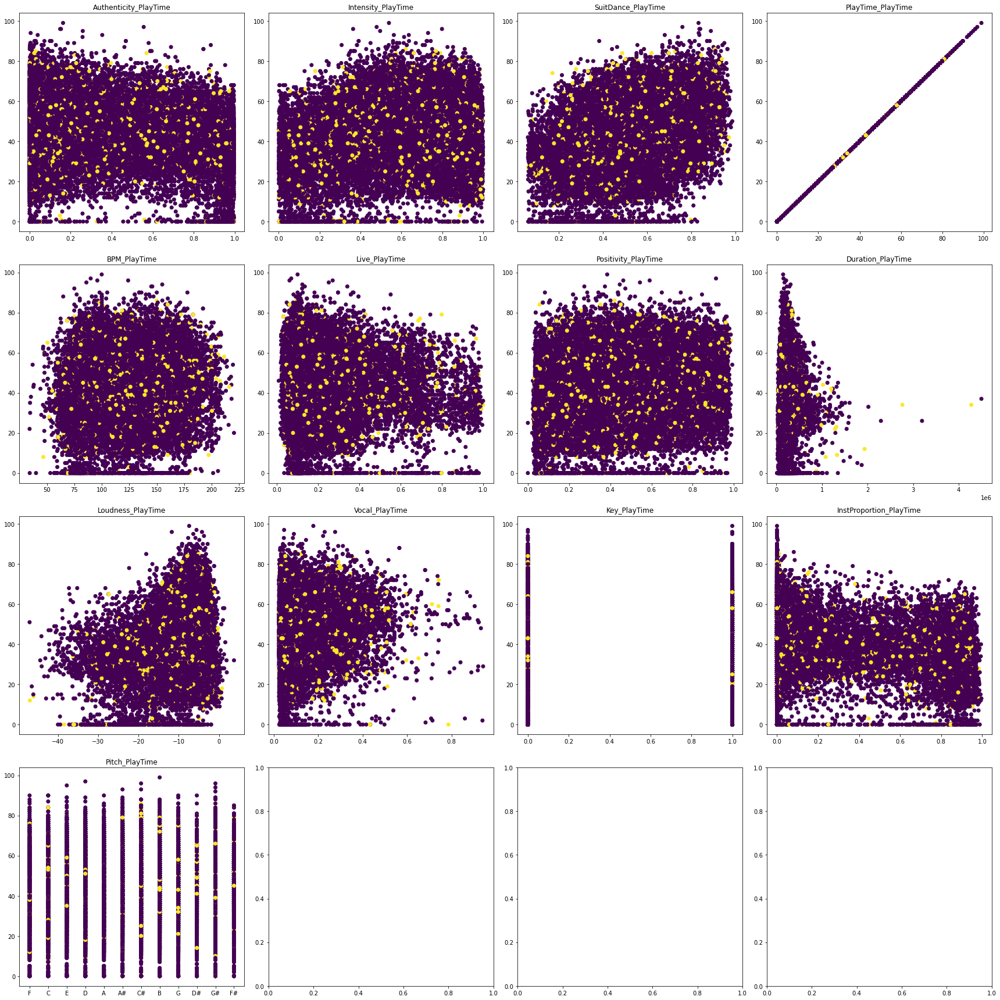

In [21]:
#plot graph
current = 3
plt.rcParams["figure.figsize"] = [24.00, 24.00]
plt.rcParams["figure.autolayout"] = True
rowCol = math.ceil(math.sqrt(len(columnGroups['XAllDefault'])))
fig, axs = plt.subplots(rowCol, rowCol)
#yellow = appear
for i in range(len(columnGroups['XAllDefault'])):
    try:
        axs[i//rowCol][i%rowCol].scatter(df[columnGroups['XAllDefault'][i]], df[columnGroups['XAllDefault'][current]], c = appearOnTest)
        axs[i//rowCol, i%rowCol].set_title(columnGroups['XAllDefault'][i] + "_"+columnGroups['XAllDefault'][current])
    except TypeError:
        print(columnGroups['XAllDefault'][i])

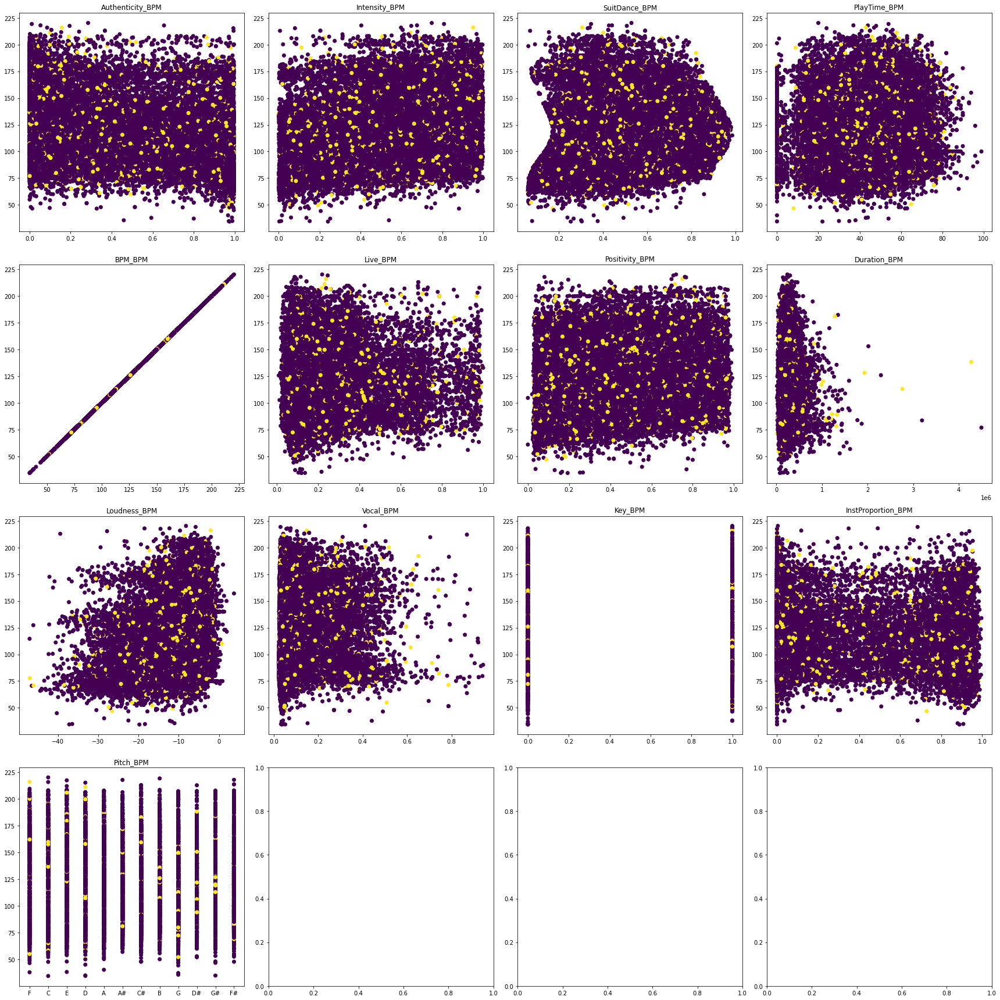

In [22]:
#plot graph
current = 4
plt.rcParams["figure.figsize"] = [24.00, 24.00]
plt.rcParams["figure.autolayout"] = True
rowCol = math.ceil(math.sqrt(len(columnGroups['XAllDefault'])))
fig, axs = plt.subplots(rowCol, rowCol)
#yellow = appear
for i in range(len(columnGroups['XAllDefault'])):
    try:
        axs[i//rowCol][i%rowCol].scatter(df[columnGroups['XAllDefault'][i]], df[columnGroups['XAllDefault'][current]], c = appearOnTest)
        axs[i//rowCol, i%rowCol].set_title(columnGroups['XAllDefault'][i] + "_"+columnGroups['XAllDefault'][current])
    except TypeError:
        print(columnGroups['XAllDefault'][i])

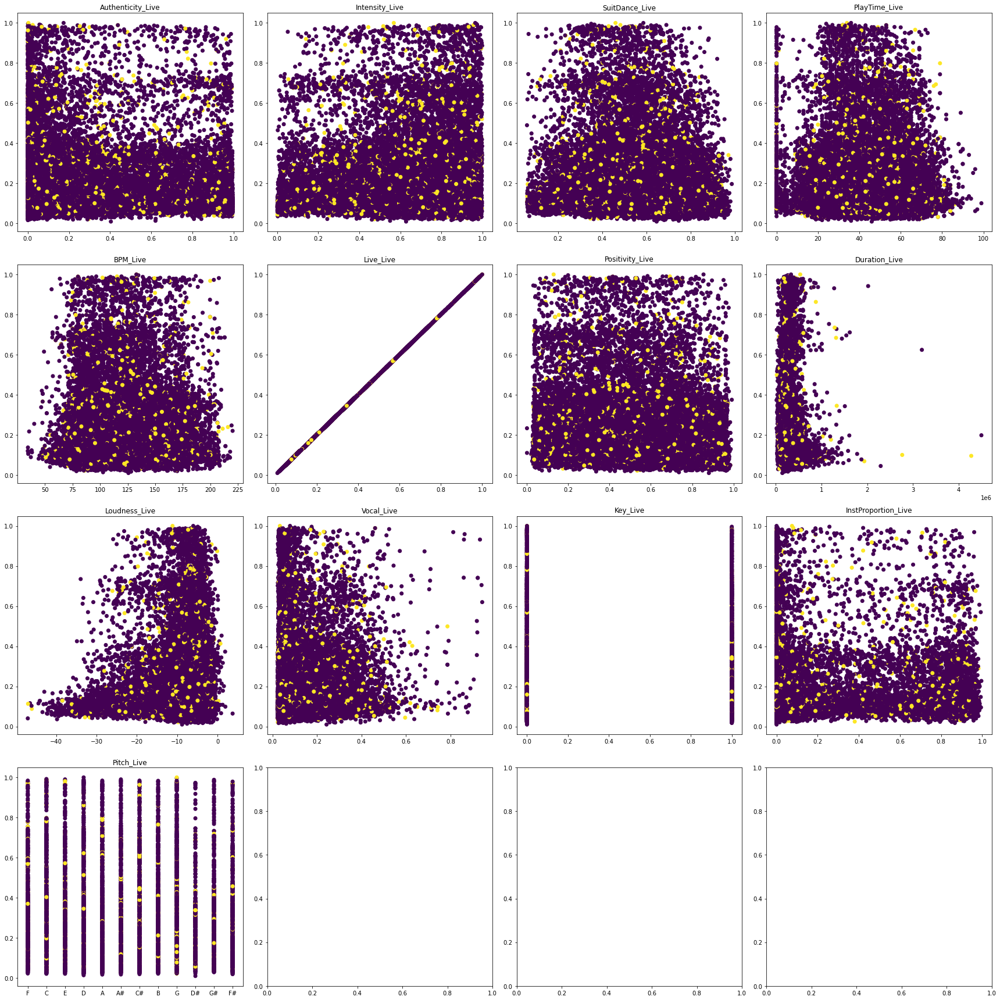

In [23]:
#plot graph
current = 5
plt.rcParams["figure.figsize"] = [24.00, 24.00]
plt.rcParams["figure.autolayout"] = True
rowCol = math.ceil(math.sqrt(len(columnGroups['XAllDefault'])))
fig, axs = plt.subplots(rowCol, rowCol)
#yellow = appear
for i in range(len(columnGroups['XAllDefault'])):
    try:
        axs[i//rowCol][i%rowCol].scatter(df[columnGroups['XAllDefault'][i]], df[columnGroups['XAllDefault'][current]], c = appearOnTest)
        axs[i//rowCol, i%rowCol].set_title(columnGroups['XAllDefault'][i] + "_"+columnGroups['XAllDefault'][current])
    except TypeError:
        print(columnGroups['XAllDefault'][i])

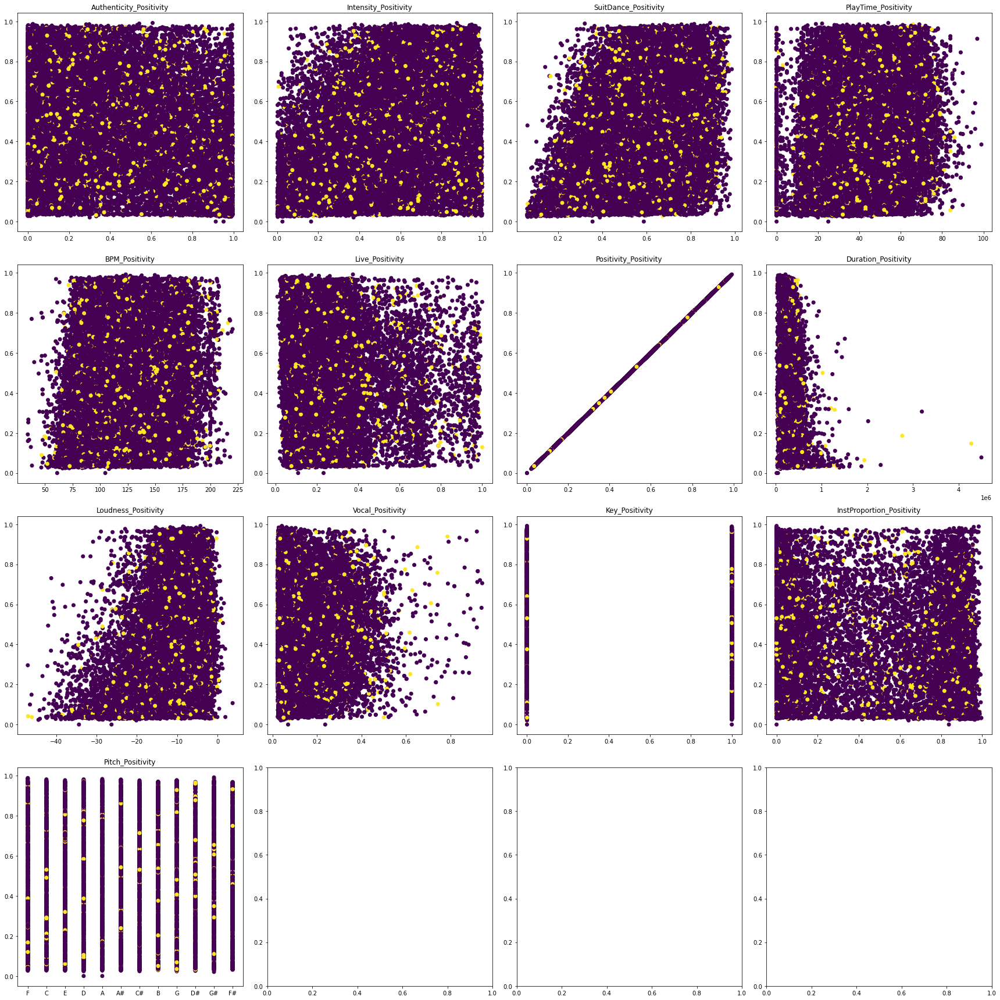

In [24]:
#plot graph
current = 6
plt.rcParams["figure.figsize"] = [24.00, 24.00]
plt.rcParams["figure.autolayout"] = True
rowCol = math.ceil(math.sqrt(len(columnGroups['XAllDefault'])))
fig, axs = plt.subplots(rowCol, rowCol)
#yellow = appear
for i in range(len(columnGroups['XAllDefault'])):
    try:
        axs[i//rowCol][i%rowCol].scatter(df[columnGroups['XAllDefault'][i]], df[columnGroups['XAllDefault'][current]], c = appearOnTest)
        axs[i//rowCol, i%rowCol].set_title(columnGroups['XAllDefault'][i] + "_"+columnGroups['XAllDefault'][current])
    except TypeError:
        print(columnGroups['XAllDefault'][i])

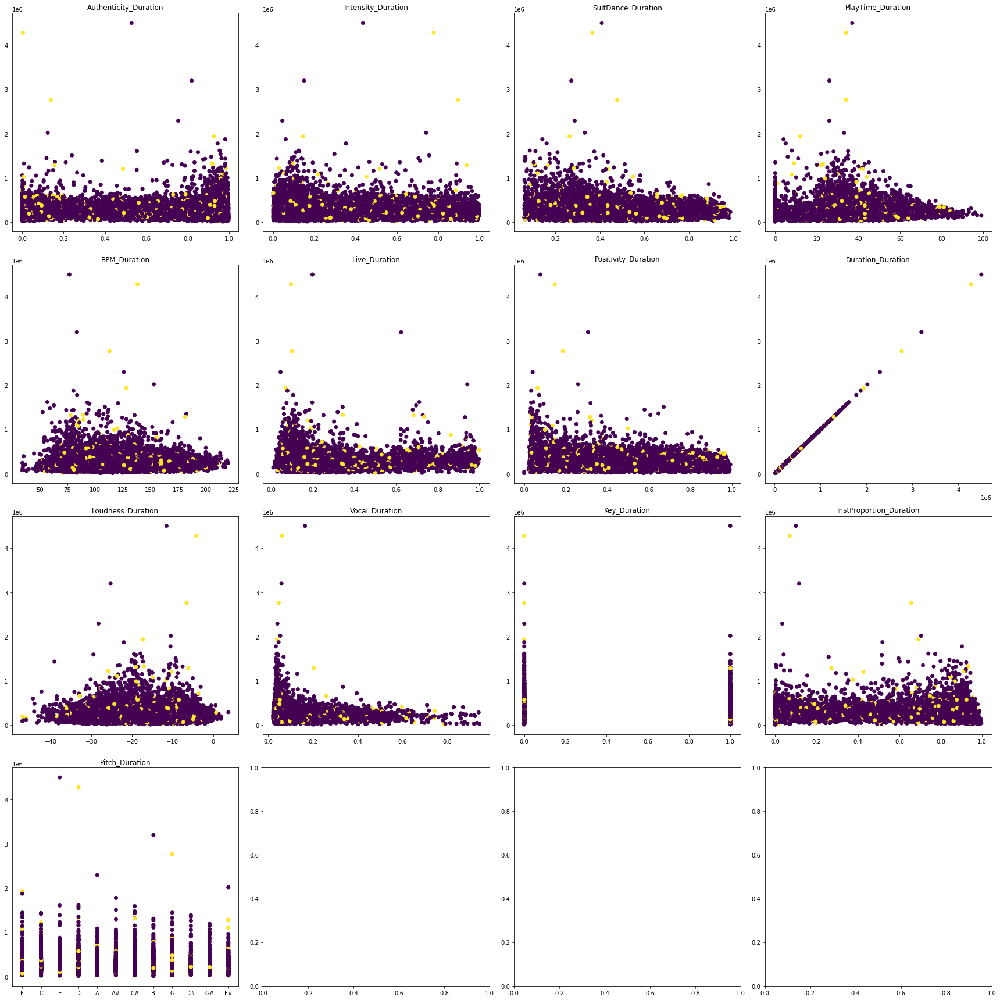

In [25]:
#plot graph
current = 7
plt.rcParams["figure.figsize"] = [24.00, 24.00]
plt.rcParams["figure.autolayout"] = True
rowCol = math.ceil(math.sqrt(len(columnGroups['XAllDefault'])))
fig, axs = plt.subplots(rowCol, rowCol)
#yellow = appear
for i in range(len(columnGroups['XAllDefault'])):
    try:
        axs[i//rowCol][i%rowCol].scatter(df[columnGroups['XAllDefault'][i]], df[columnGroups['XAllDefault'][current]], c = appearOnTest)
        axs[i//rowCol, i%rowCol].set_title(columnGroups['XAllDefault'][i] + "_"+columnGroups['XAllDefault'][current])
    except TypeError:
        print(columnGroups['XAllDefault'][i])

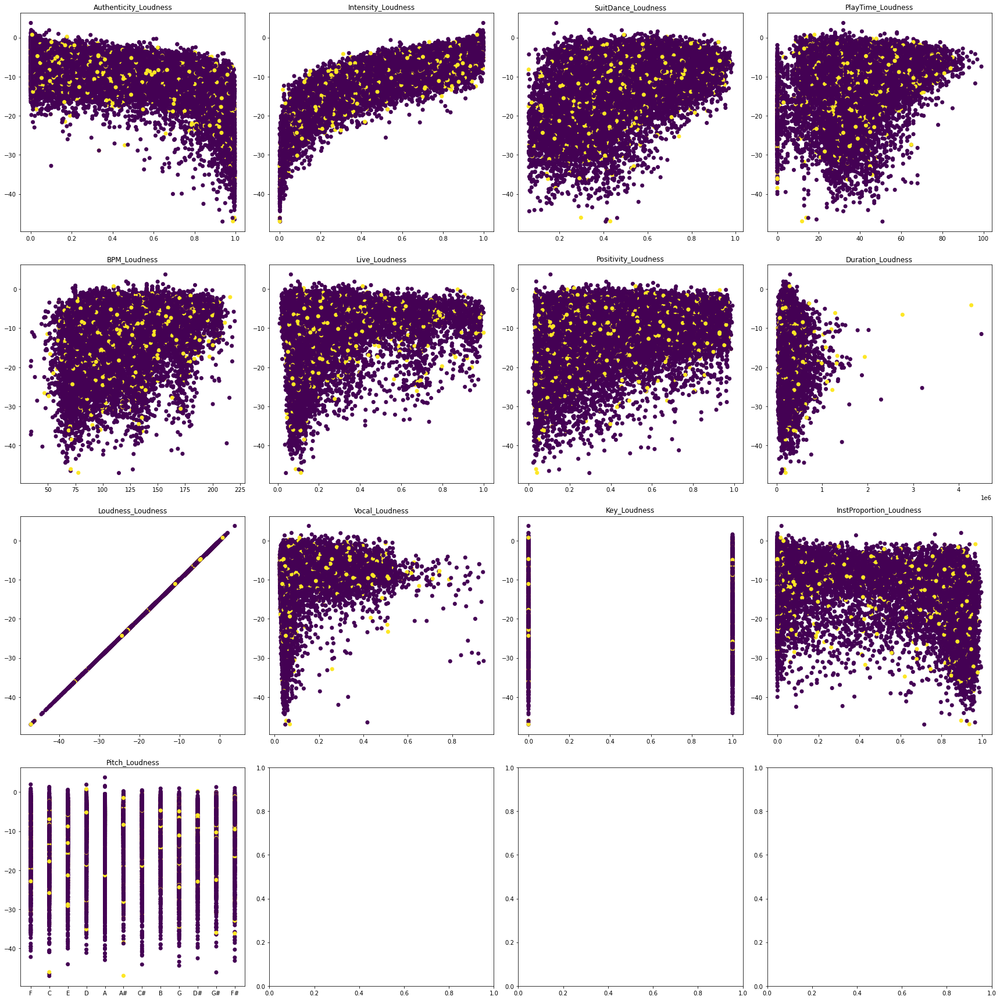

In [26]:
#plot graph
current = 8
plt.rcParams["figure.figsize"] = [24.00, 24.00]
plt.rcParams["figure.autolayout"] = True
rowCol = math.ceil(math.sqrt(len(columnGroups['XAllDefault'])))
fig, axs = plt.subplots(rowCol, rowCol)
#yellow = appear
for i in range(len(columnGroups['XAllDefault'])):
    try:
        axs[i//rowCol][i%rowCol].scatter(df[columnGroups['XAllDefault'][i]], df[columnGroups['XAllDefault'][current]], c = appearOnTest)
        axs[i//rowCol, i%rowCol].set_title(columnGroups['XAllDefault'][i] + "_"+columnGroups['XAllDefault'][current])
    except TypeError:
        print(columnGroups['XAllDefault'][i])

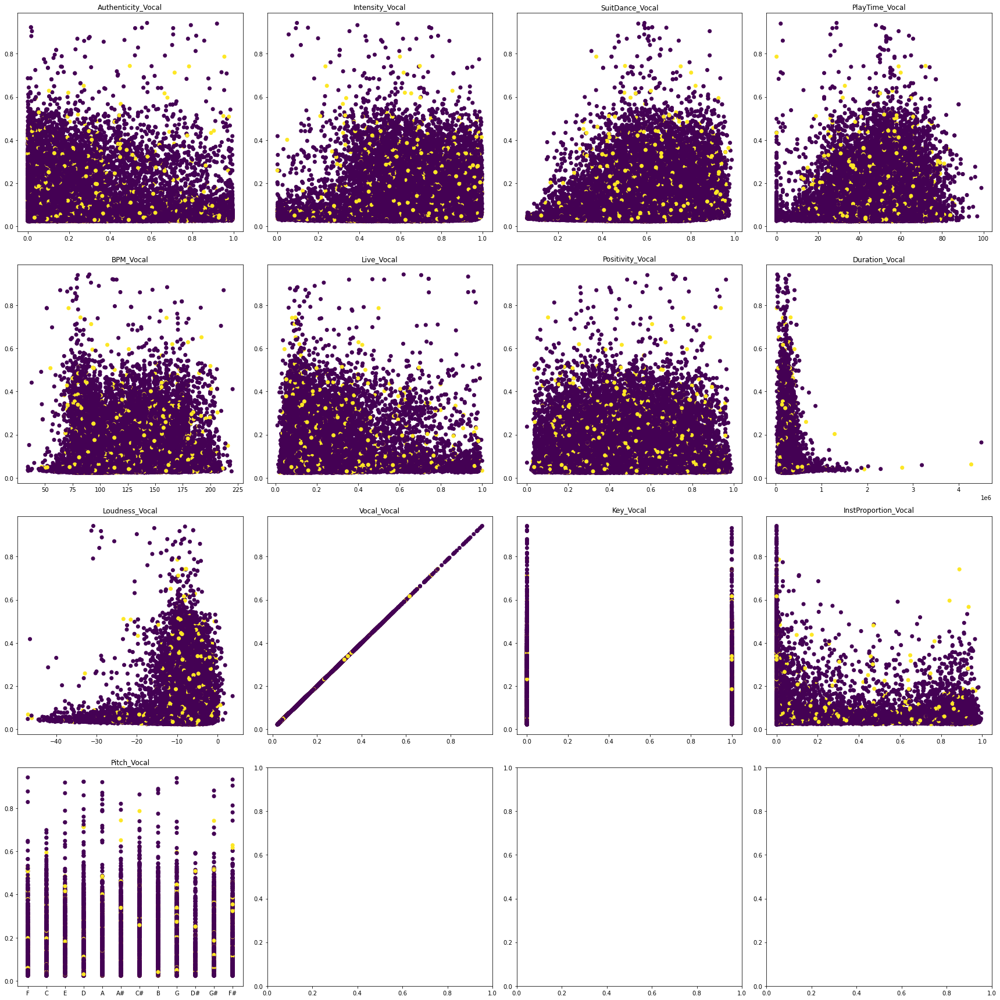

In [27]:
#plot graph
current = 9
plt.rcParams["figure.figsize"] = [24.00, 24.00]
plt.rcParams["figure.autolayout"] = True
rowCol = math.ceil(math.sqrt(len(columnGroups['XAllDefault'])))
fig, axs = plt.subplots(rowCol, rowCol)
#yellow = appear
for i in range(len(columnGroups['XAllDefault'])):
    try:
        axs[i//rowCol][i%rowCol].scatter(df[columnGroups['XAllDefault'][i]], df[columnGroups['XAllDefault'][current]], c = appearOnTest)
        axs[i//rowCol, i%rowCol].set_title(columnGroups['XAllDefault'][i] + "_"+columnGroups['XAllDefault'][current])
    except TypeError:
        print(columnGroups['XAllDefault'][i])

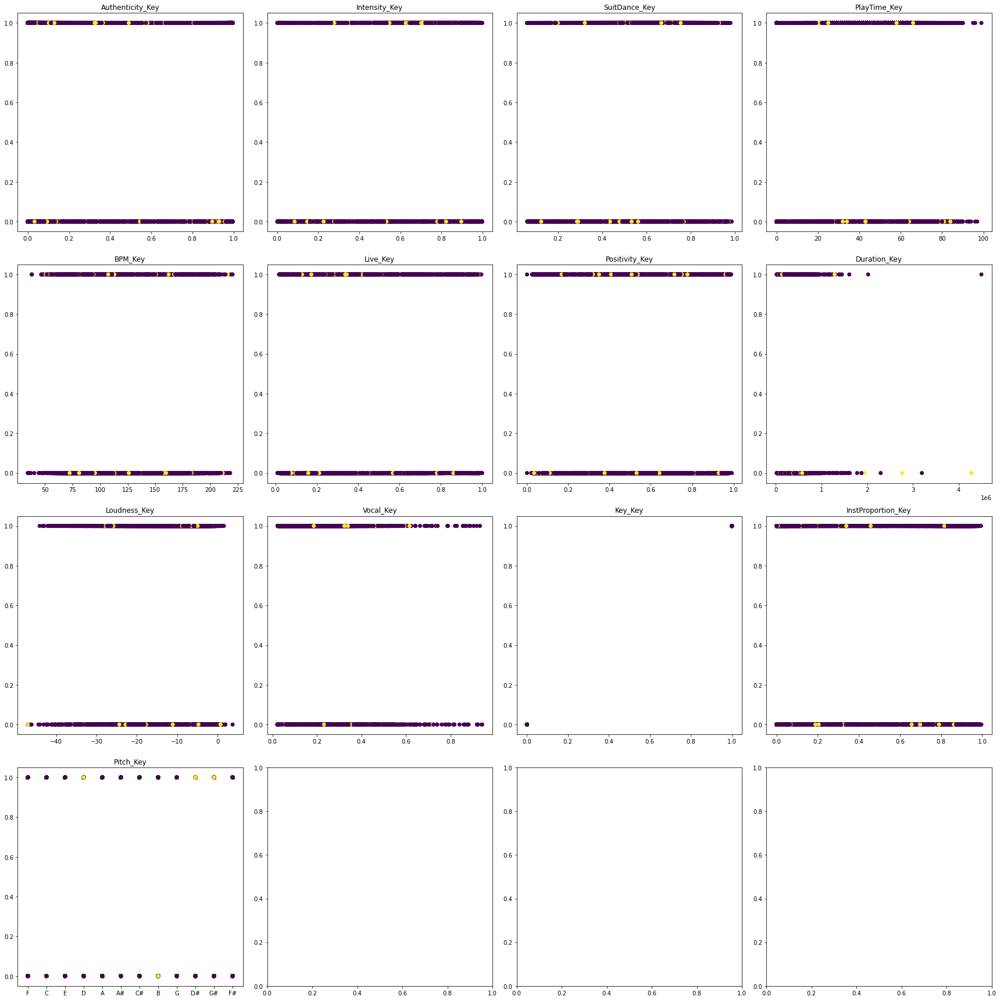

In [28]:
#plot graph
current = 10
plt.rcParams["figure.figsize"] = [24.00, 24.00]
plt.rcParams["figure.autolayout"] = True
rowCol = math.ceil(math.sqrt(len(columnGroups['XAllDefault'])))
fig, axs = plt.subplots(rowCol, rowCol)
#yellow = appear
for i in range(len(columnGroups['XAllDefault'])):
    try:
        axs[i//rowCol][i%rowCol].scatter(df[columnGroups['XAllDefault'][i]], df[columnGroups['XAllDefault'][current]], c = appearOnTest)
        axs[i//rowCol, i%rowCol].set_title(columnGroups['XAllDefault'][i] + "_"+columnGroups['XAllDefault'][current])
    except TypeError:
        print(columnGroups['XAllDefault'][i])

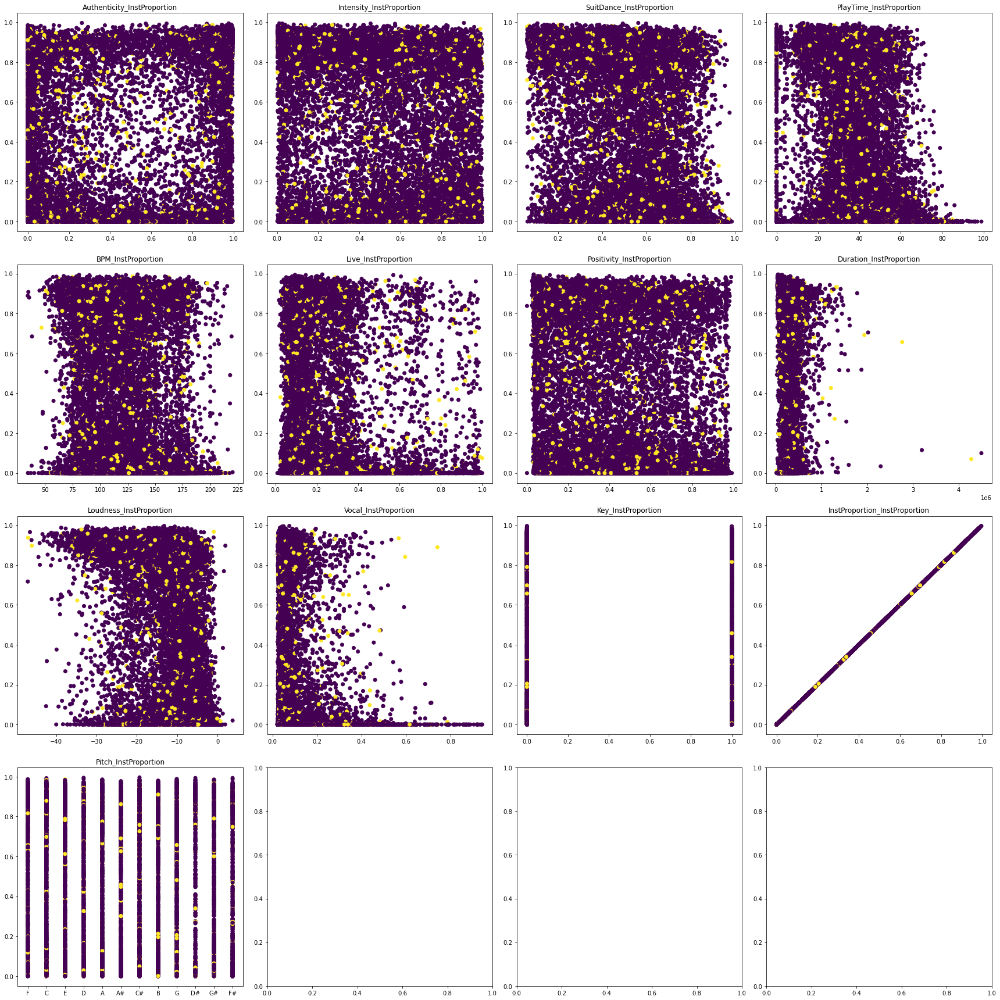

In [29]:
#plot graph
current = 11
plt.rcParams["figure.figsize"] = [24.00, 24.00]
plt.rcParams["figure.autolayout"] = True
rowCol = math.ceil(math.sqrt(len(columnGroups['XAllDefault'])))
fig, axs = plt.subplots(rowCol, rowCol)
#yellow = appear
for i in range(len(columnGroups['XAllDefault'])):
    try:
        axs[i//rowCol][i%rowCol].scatter(df[columnGroups['XAllDefault'][i]], df[columnGroups['XAllDefault'][current]], c = appearOnTest)
        axs[i//rowCol, i%rowCol].set_title(columnGroups['XAllDefault'][i] + "_"+columnGroups['XAllDefault'][current])
    except TypeError:
        print(columnGroups['XAllDefault'][i])

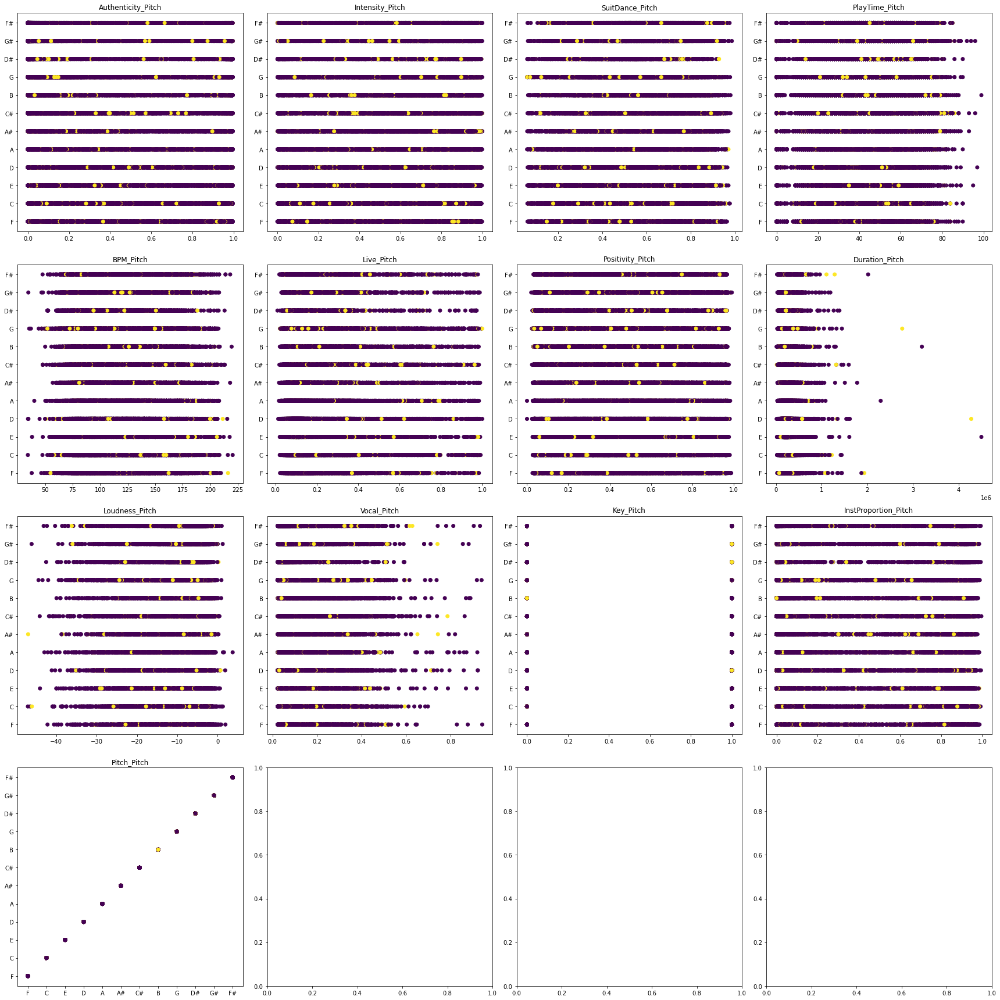

In [30]:
#plot graph
current = 12
plt.rcParams["figure.figsize"] = [24.00, 24.00]
plt.rcParams["figure.autolayout"] = True
rowCol = math.ceil(math.sqrt(len(columnGroups['XAllDefault'])))
fig, axs = plt.subplots(rowCol, rowCol)
#yellow = appear
for i in range(len(columnGroups['XAllDefault'])):
    try:
        axs[i//rowCol][i%rowCol].scatter(df[columnGroups['XAllDefault'][i]], df[columnGroups['XAllDefault'][current]], c = appearOnTest)
        axs[i//rowCol, i%rowCol].set_title(columnGroups['XAllDefault'][i] + "_"+columnGroups['XAllDefault'][current])
    except TypeError:
        print(columnGroups['XAllDefault'][i])

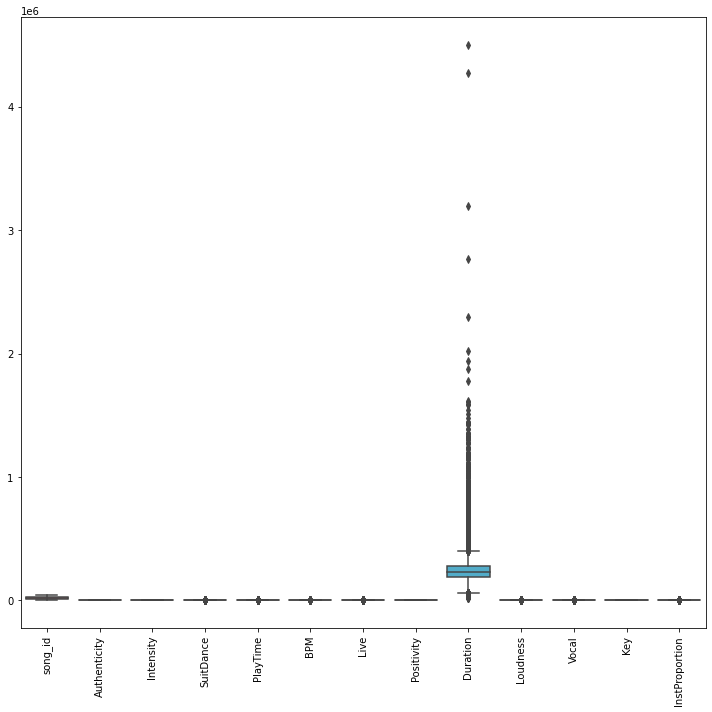

In [31]:
plt.figure(figsize=(10,10))
sns.boxplot(data=df)
plt.xticks(rotation=90)
plt.show()

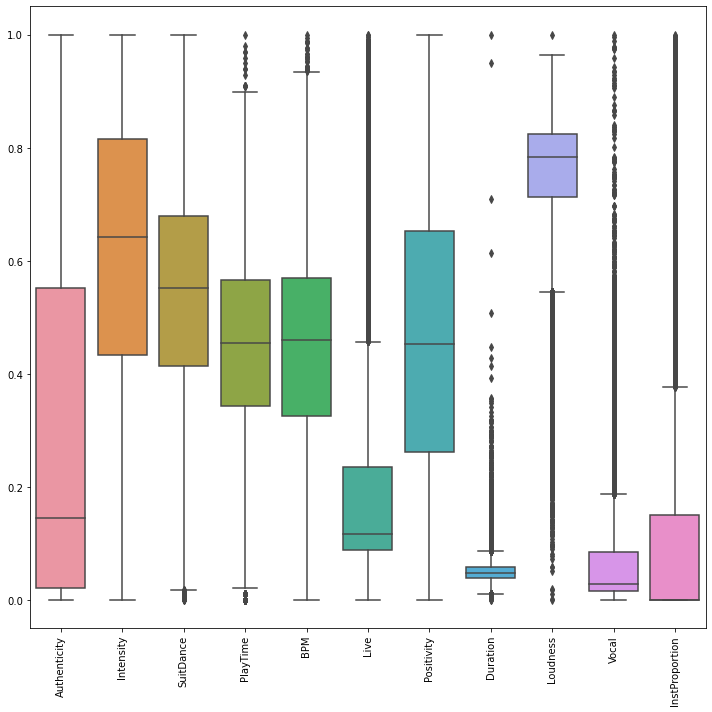

In [32]:
#apply min max scaling to view data better
from sklearn.preprocessing import MinMaxScaler
tempdf = df.copy()
tempdf[columnGroups['XNumericDefault']] = MinMaxScaler(feature_range = (0,1)).fit_transform(tempdf[columnGroups['XNumericDefault']])
plt.figure(figsize=(10,10))
sns.boxplot(data=tempdf[columnGroups['XNumericDefault']])
plt.xticks(rotation=90)
plt.show()

In [33]:
#Outlier Detection
def find_outliers_IQR(df):
    q1=df.quantile(0.25)
    q3=df.quantile(0.75)
    IQR=q3-q1
    mask = ((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR))).any(axis=1)
    allOutliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]
    outliers = df[mask]
    return outliers,allOutliers.any()
res, truefalse = find_outliers_IQR(df)

#print howmany of each column contain outlier
print(truefalse)

song_id           False
Authenticity      False
Intensity         False
SuitDance          True
PlayTime           True
BPM                True
Live               True
Positivity        False
Duration           True
Loudness           True
Vocal              True
Key               False
InstProportion     True
Pitch             False
dtype: bool


C:\Users\Bryan\AppData\Local\Temp\ipykernel_3920\932178290.py:6: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  mask = ((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR))).any(axis=1)
C:\Users\Bryan\AppData\Local\Temp\ipykernel_3920\932178290.py:7: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  allOutliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]


In [34]:
#Outlier Detection
res, truefalse = find_outliers_IQR(df[columnGroups["NormalOnlyPlusInst"]])
print("==========")
print(res)
print("==========")
outlierIndices = set(res.index)
testButOutlier = []
for i in idxSets:
    if i in outlierIndices:
        testButOutlier.append(i)

print(len(testButOutlier))
print(len(idxSets))

       SuitDance  PlayTime      BPM  Positivity  InstProportion
0          0.745        46  111.016      0.3880           0.651
7          0.310        10  135.423      0.2980           0.387
11         0.316        26  154.381      0.3600           0.857
13         0.292        43   87.910      0.0658           0.904
17         0.515        46  143.017      0.9610           0.896
...          ...       ...      ...         ...             ...
40064      0.168        14   96.005      0.1560           0.526
40067      0.495        10  149.941      0.9630           0.933
40080      0.763        66  141.995      0.5090           0.873
40082      0.764        46  121.607      0.2870           0.824
40089      0.478        34  113.018      0.1860           0.657

[8771 rows x 5 columns]
634
2984


In [35]:
#Outlier Detection
def find_outliers_std(df):
    q1=df.quantile(0.25)
    q3=df.quantile(0.75)
    IQR=q3-q1
    mask = ((df<(df.mean() - 3*df.std())) | (df>(df.mean() + 3*df.std()))).any(axis=1)
    allOutliers = df[((df<(df.mean() - 3*df.std())) | (df>(df.mean() + 3*df.std())))]
    outliers = df[mask]
    return outliers,allOutliers.any()
res, truefalse = find_outliers_std(df)

#print howmany of each column contain outlier
print(truefalse)

C:\Users\Bryan\AppData\Local\Temp\ipykernel_3920\1672415219.py:6: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  mask = ((df<(df.mean() - 3*df.std())) | (df>(df.mean() + 3*df.std()))).any(axis=1)
C:\Users\Bryan\AppData\Local\Temp\ipykernel_3920\1672415219.py:6: FutureWarning: Automatic reindexing on DataFrame vs Series comparisons is deprecated and will raise ValueError in a future version. Do `left, right = left.align(right, axis=1, copy=False)` before e.g. `left == right`
  mask = ((df<(df.mean() - 3*df.std())) | (df>(df.mean() + 3*df.std()))).any(axis=1)
C:\Users\Bryan\AppData\Local\Temp\ipykernel_3920\1672415219.py:7: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling th

song_id           False
Authenticity      False
Intensity         False
SuitDance         False
PlayTime           True
BPM                True
Live               True
Positivity        False
Duration           True
Loudness           True
Vocal              True
Key               False
InstProportion    False
Pitch             False
dtype: bool


In [36]:
#Outlier Detection
res, truefalse = find_outliers_std(df[columnGroups["NormalOnlyPlusInst"]])
print("==========")
print(res)
print("==========")
outlierIndices = set(res.index)
testButOutlier = []
for i in idxSets:
    if i in outlierIndices:
        testButOutlier.append(i)

print(len(testButOutlier))
print(len(idxSets))

       SuitDance  PlayTime      BPM  Positivity  InstProportion
2670      0.3310        24  215.359      0.1960        0.937000
2989      0.0696        41  212.923      0.0881        0.921000
3096      0.4240        53  213.788      0.3970        0.000272
3278      0.1550        28  211.687      0.1630        0.836000
3318      0.5110        55  212.137      0.4050        0.000000
6777      0.4270        44  217.927      0.0803        0.349000
9244      0.8370        93  145.972      0.2740        0.001250
11512     0.8340        94  155.008      0.4460        0.000000
14882     0.5290        20  220.276      0.7190        0.004100
15131     0.5910        45  213.038      0.1120        0.900000
15310     0.6800        93  145.028      0.3740        0.000000
16427     0.3060        43  216.029      0.7500        0.000001
19155     0.8890        95   86.003      0.5440        0.000000
20650     0.5910        45  213.038      0.1120        0.900000
20805     0.8330        99   99.947     

# Model Building

In [9]:
#convert string of pitch to int
for i in range(len(df)):
    if(type(df.at[i,'Pitch']) == str):
        df.at[i,'Pitch'] = convertPitchInt(df.at[i,'Pitch'])
df['Pitch'] = pd.to_numeric(df['Pitch'])
print(df['Pitch'].unique)
print(df)

<bound method Series.unique of 0         5
1         0
2         4
3         2
4         2
         ..
40109     2
40110     0
40111    11
40112     1
40113     7
Name: Pitch, Length: 40114, dtype: int64>
       song_id  Authenticity  Intensity  SuitDance  PlayTime      BPM    Live  \
0            0       0.14700      0.798      0.745        46  111.016  0.1970   
1            1       0.06580      0.804      0.521        66  143.952  0.0521   
2            2       0.03950      0.960      0.755        67   99.023  0.3320   
3            3       0.35900      0.769      0.592        40  171.940  0.1220   
4            4       0.16000      0.838      0.769        83   93.996  0.0935   
...        ...           ...        ...        ...       ...      ...     ...   
40109    40109       0.00923      0.760      0.761        48  144.977  0.4690   
40110    40110       0.43000      0.533      0.495        50   79.710  0.1060   
40111    40111       0.03280      0.823      0.562        43  126.

In [ ]:
#two combo mode using kmeans
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import PowerTransformer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler # Feature Scaling
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
import optuna
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering,MiniBatchKMeans,AffinityPropagation,SpectralClustering,OPTICS,Birch,MeanShift
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import numpy as np
from kmodes.kprototypes import KPrototypes
#import kmedoids
import hdbscan
from sklearn.mixture import GaussianMixture
from itertools import combinations
datasetConfig = {
            "OutlierChoices":None, #None, CAP_STD,CAP_IQR, DROP_IQR,DROP_STD,DROP_CAP_STD,DROP_CAP_IQR. CAP IQR IS NOT A GOOD CHOICE!
            "SamplingChoices":None, #None, or int, 0 for target only
           "skewFix?":False,
            "OneHotEncoding?":True,
           "Scaler": "MinMax", #"Standard",
            "PCA?":None, 
           }

kernelConfig = {
               "PredefinedNeighbor":7,
                "minimalDistanceAGG":21,
                "mixtureComponentGMM":7,
               }

ExperimentedColumns = columnGroups["XAllDefault"]
experimentedLists = list(combinations(ExperimentedColumns, 2))
test_df = pd.read_csv(path+"test_3000.csv")
submit_df = pd.read_csv(path+"submit.csv")
#compare_df = pd.read_csv("/kaggle/input/testforhw/submissionKMEANS_PopularityOnly__3_False_True_MinMax_False (1).csv")
compare_df = pd.read_csv("similarityComparison.csv")
col1 = test_df['col_1'].tolist()
col2 = test_df['col_2'].tolist()
silScores = []
found0s = []
found1s = []
var1s = []
var2s = []
same0s = []
same1s = []
sames = []
similarityFloat = []
print(f"Total trial = {len(experimentedLists)}")
n_iter = 0
for trial in experimentedLists:
    var1s.append(trial[0])
    var2s.append(trial[1])
    trial = list(trial)
    if n_iter%10==0:
        print(f"Now n_iter at = {n_iter}")
    n_iter+=1
    X = df[trial].copy()
    colNamesOrdered = list(X.columns)



    resultMapping = {} #only used if outlier choices is in ["DROP_IQR", "DROP_STD", "DROP_CAP_STD", "DROP_CAP_IQR"], maps originalIdx ->renewedIdx
    if datasetConfig["OutlierChoices"] or datasetConfig["SamplingChoices"] != None:

        #handle outlier
        if datasetConfig["OutlierChoices"] == "CAP_STD" or datasetConfig["OutlierChoices"] == "CAP_IQR":
            #make sure to cap the outliers for all
            for i in colNamesOrdered:
                if i in columnGroups["XNumericDefault"]:
                    q1=X[i].quantile(0.25)
                    q3=X[i].quantile(0.75)
                    IQR=q3-q1
                    if datasetConfig["OutlierChoices"] == "CAP_IQR":
                        upperLimit = q3+1.5*IQR
                        lowerLimit = q1-1.5*IQR
                    else:
                        upperLimit = X[i].mean() + 3*X[i].std()
                        lowerLimit = X[i].mean() - 3*X[i].std()
                    X[i] = np.where(X[i] > upperLimit, upperLimit,
                            np.where(X[i] < lowerLimit,lowerLimit, X[i])
                    )


        if datasetConfig["OutlierChoices"] in ["DROP_IQR", "DROP_STD", "DROP_CAP_STD", "DROP_CAP_IQR"]:
            #drop_cap means drop the outlier non exist in test, but keep the one in test_3000
            temp = list(idxSets)
            for i in range(len(temp)):
                resultMapping[temp[i]] = i

            tempMask = [True if i in idxSets else False for i in range(len(X))]
            tempExpand = [[True for j in colNamesOrdered] if i in idxSets else [False for j in colNamesOrdered] for i in range(len(X))]
            #handle first if DROP_CAP_STD, DROP_CAP_IQR
            if datasetConfig["OutlierChoices"] in ["DROP_CAP_STD", "DROP_CAP_IQR"]:
                for i in colNamesOrdered:
                    if i in columnGroups["XNumericDefault"]:
                        q1=X[i].quantile(0.25)
                        q3=X[i].quantile(0.75)
                        IQR=q3-q1
                        if datasetConfig["OutlierChoices"] == "CAP_IQR":
                            upperLimit = q3+1.5*IQR
                            lowerLimit = q1-1.5*IQR
                        else:
                            upperLimit = X[i].mean() + 3*X[i].std()
                            lowerLimit = X[i].mean() - 3*X[i].std()
                        X[i] = np.where(X[i] > upperLimit & tempMask, upperLimit,
                                np.where(X[i] < lowerLimit & temepMask,lowerLimit, X[i])
                        )

            XtestOnly = X[tempExpand]
            XwithoutTest = X[~tempExpand]

        elif datasetConfig["OutlierChoices"] not in ["CAP_STD", "CAP_IQR"] and datasetConfig["OutlierChoices"]!=None:
            raise ValueError

        #handle sampling
        if datasetConfig["SamplingChoices"] != None:
            #drop_cap means drop the outlier non exist in test, but keep the one in test_3000
            temp = list(idxSets)
            for i in range(len(temp)):
                resultMapping[temp[i]] = i
            tempMask = [True if i in idxSets else False for i in range(len(X))]
            reverseTempMask = [False if i in idxSets else True for i in range(len(X))]
            XwithTest = X[tempMask].copy()

            XwithTest = XwithTest.reset_index(drop = True)
            XwithNoTest = X[reverseTempMask].copy()
            if datasetConfig["SamplingChoices"] > 0:
                XwithNoTest = XwithNoTest.sample(datasetConfig["SamplingChoices"], ignore_index = True,random_state=42)
                print(f"len now of test = {len(XwithTest)} and no test = {len(XwithNoTest)}")
                X = pd.concat([XwithTest, XwithNoTest], ignore_index=True)
            else:
                print(f"len now of test = {len(XwithTest)}")
                X = XwithTest
    Xtrain = X.copy()
    Xtrain = Xtrain.values

    #split categorical and numerical
    categoryIndices = []
    numericIndices = []
    for i in range(len(colNamesOrdered)):
        if colNamesOrdered[i] in columnGroups['XCategoryDefault']:
            categoryIndices.append(i)
        else:
            numericIndices.append(i)

    XtrainNumeric = Xtrain[:, numericIndices]
    XtrainCategory = Xtrain[:, categoryIndices]

    #repair skew only for numerical data
    if datasetConfig["skewFix?"] and  len(numericIndices) != 0:
        skewFixer = ColumnTransformer(transformers=[('PowerTransform', PowerTransformer(standardize = False), [i for i in range(XtrainNumeric.shape[1])])], remainder = "drop")
        XtrainNumeric = skewFixer.fit_transform(XtrainNumeric)

    #scale, both one hot encoding and also 
    if datasetConfig["Scaler"] != None and  len(numericIndices) != 0:
        scalerNumeric = None
        scalerCategory = None
        if datasetConfig["Scaler"] == "Robust":
            scalerNumeric = RobustScaler()
            if(len(categoryIndices) != 0):
                scalerCategory = RobustScaler()
        elif datasetConfig["Scaler"] == "Standard":
            scalerNumeric = StandardScaler()
            if(len(categoryIndices) != 0):
                scalerCategory = StandardScaler()
        elif datasetConfig["Scaler"] == "MinMax":
            scalerNumeric = MinMaxScaler(feature_range = [0,1])
            if(len(categoryIndices) != 0):
                scalerCategory = MinMaxScaler()
        elif datasetConfig["Scaler"] != None:
            raise ValueError("Scaler invalid")
        XtrainNumeric = scalerNumeric.fit_transform(XtrainNumeric)
        if(len(categoryIndices) != 0):
            XtrainCategory = scalerCategory.fit_transform(XtrainCategory)

    #PCA
    if datasetConfig["PCA?"] and  len(numericIndices) != 0:
        PCATrans = PCA(n_components=datasetConfig["PCA?"])
        XtrainNumeric = PCATrans.fit_transform(XtrainNumeric)
        plt.rcParams["figure.figsize"] = [24.00, 24.00]
        plt.rcParams["figure.autolayout"] = True
        fig, axs = plt.subplots(datasetConfig["PCA?"], datasetConfig["PCA?"])
        for k in range(datasetConfig["PCA?"]):
            for j in range(datasetConfig["PCA?"]):
                axs[k][j].scatter(XtrainNumeric[:,k], XtrainNumeric[:,j], c = appearOnTest)
                axs[k, j].set_title(str(k) + "_"+str(j))
        fig.show()
        print("finish")       

    #One hot encoding if necessary for categorical columns
    if datasetConfig["OneHotEncoding?"] and  len(categoryIndices) != 0:
        oneHot = ColumnTransformer(transformers=[('encoder', OneHotEncoder(drop = 'first'), [i for i in range(XtrainCategory.shape[1])])], remainder = 'drop')
        XtrainCategory = oneHot.fit_transform(XtrainCategory)
        if type(XtrainCategory).__module__ != np.__name__:
            XtrainCategory = XtrainCategory.toarray()
        #print(XtrainCategory.shape)

    #Concat the numeric and category
    if(len(categoryIndices) != 0) and  len(numericIndices) != 0:
        Xtrain = np.concatenate([XtrainNumeric, XtrainCategory], axis = 1)
    elif (len(categoryIndices) == 0):
        
        Xtrain = XtrainNumeric
    else:
        Xtrain = XtrainCategory

    model = KMeans(n_clusters = kernelConfig['PredefinedNeighbor'], random_state = 42)
    model.fit(Xtrain)
    labels = model.labels_
    score1 = silhouette_score(Xtrain,labels)
    found0 = 0
    found1 = 0
    same0 = 0
    same1 = 0
    if datasetConfig["SamplingChoices"] != None:
        for i in range(len(test_df)):
            ans1 = labels[resultMapping[col1[i]]]
            ans2 = labels[resultMapping[col2[i]]]
            if ans1 == ans2:
                found1 += 1
                if compare_df['ans'][i] == 1:
                    same1+=1
            else:
                found0 += 1
                if compare_df['ans'][i] == 0:
                    same0+=1
    else:
        for i in range(len(test_df)):
            ans1 = labels[col1[i]]
            ans2 = labels[col2[i]]
            if ans1 == ans2:
                found1 += 1
                if compare_df['ans'][i] == 1:
                    same1+=1
            else:
                found0 += 1
                if compare_df['ans'][i] == 0:
                    same0+=1
    silScores.append(score1)
    found0s.append(found0)
    found1s.append(found1)
    same0s.append(same0)
    same1s.append(same1)
    sames.append(same0+same1)
    similarityFloat.append((same0+same1)/len(compare_df))
evaldf = pd.DataFrame(list(zip(var1s, var2s, silScores, found0s,found1s,same0s,same1s,sames,similarityFloat)), 
                     columns =['var1', 'var2', 'silhouette',  'amt0', 'amt1', 'same0s','same1s','sames','similarityFloat'])
#evaldf.to_csv('/kaggle/working/evaldf_minmax_2.csv', index = False)
evaldf.to_csv('evaldf_minmax_2.csv', index = False)
print("Finish Saving")


In [ ]:
#three combo mode using kmeans
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import PowerTransformer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler # Feature Scaling
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
import optuna
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering,MiniBatchKMeans,AffinityPropagation,SpectralClustering,OPTICS,Birch,MeanShift
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import numpy as np
from kmodes.kprototypes import KPrototypes
#import kmedoids
import hdbscan
from sklearn.mixture import GaussianMixture
from itertools import combinations
datasetConfig = {
            "OutlierChoices":None, #None, CAP_STD,CAP_IQR, DROP_IQR,DROP_STD,DROP_CAP_STD,DROP_CAP_IQR. CAP IQR IS NOT A GOOD CHOICE!
            "SamplingChoices":None, #None, or int, 0 for target only
           "skewFix?":False,
            "OneHotEncoding?":True,
           "Scaler": "MinMax", #"Standard",
            "PCA?":None, 
           }

kernelConfig = {
               "PredefinedNeighbor":7,
                "minimalDistanceAGG":21,
                "mixtureComponentGMM":7,
               }

ExperimentedColumns = columnGroups["XAllDefault"]
experimentedLists = list(combinations(ExperimentedColumns, 3))
test_df = pd.read_csv(path+"test_3000.csv")
submit_df = pd.read_csv(path+"submit.csv")
#compare_df = pd.read_csv("/kaggle/input/testforhw/submissionKMEANS_PopularityOnly__3_False_True_MinMax_False (1).csv")
compare_df = pd.read_csv("similarityComparison.csv")
col1 = test_df['col_1'].tolist()
col2 = test_df['col_2'].tolist()
silScores = []
found0s = []
found1s = []
var1s = []
var2s = []
var3s = []
same0s = []
same1s = []
sames = []
similarityFloat = []
print(f"Total trial = {len(experimentedLists)}")
n_iter = 0
for trial in experimentedLists:
    var1s.append(trial[0])
    var2s.append(trial[1])
    var3s.append(trial[2])
    trial = list(trial)
    if n_iter%10==0:
        print(f"Now n_iter at = {n_iter}")
    n_iter+=1
    X = df[trial].copy()
    colNamesOrdered = list(X.columns)



    resultMapping = {} #only used if outlier choices is in ["DROP_IQR", "DROP_STD", "DROP_CAP_STD", "DROP_CAP_IQR"], maps originalIdx ->renewedIdx
    if datasetConfig["OutlierChoices"] or datasetConfig["SamplingChoices"] != None:

        #handle outlier
        if datasetConfig["OutlierChoices"] == "CAP_STD" or datasetConfig["OutlierChoices"] == "CAP_IQR":
            #make sure to cap the outliers for all
            for i in colNamesOrdered:
                if i in columnGroups["XNumericDefault"]:
                    q1=X[i].quantile(0.25)
                    q3=X[i].quantile(0.75)
                    IQR=q3-q1
                    if datasetConfig["OutlierChoices"] == "CAP_IQR":
                        upperLimit = q3+1.5*IQR
                        lowerLimit = q1-1.5*IQR
                    else:
                        upperLimit = X[i].mean() + 3*X[i].std()
                        lowerLimit = X[i].mean() - 3*X[i].std()
                    X[i] = np.where(X[i] > upperLimit, upperLimit,
                            np.where(X[i] < lowerLimit,lowerLimit, X[i])
                    )


        if datasetConfig["OutlierChoices"] in ["DROP_IQR", "DROP_STD", "DROP_CAP_STD", "DROP_CAP_IQR"]:
            #drop_cap means drop the outlier non exist in test, but keep the one in test_3000
            temp = list(idxSets)
            for i in range(len(temp)):
                resultMapping[temp[i]] = i

            tempMask = [True if i in idxSets else False for i in range(len(X))]
            tempExpand = [[True for j in colNamesOrdered] if i in idxSets else [False for j in colNamesOrdered] for i in range(len(X))]
            #handle first if DROP_CAP_STD, DROP_CAP_IQR
            if datasetConfig["OutlierChoices"] in ["DROP_CAP_STD", "DROP_CAP_IQR"]:
                for i in colNamesOrdered:
                    if i in columnGroups["XNumericDefault"]:
                        q1=X[i].quantile(0.25)
                        q3=X[i].quantile(0.75)
                        IQR=q3-q1
                        if datasetConfig["OutlierChoices"] == "CAP_IQR":
                            upperLimit = q3+1.5*IQR
                            lowerLimit = q1-1.5*IQR
                        else:
                            upperLimit = X[i].mean() + 3*X[i].std()
                            lowerLimit = X[i].mean() - 3*X[i].std()
                        X[i] = np.where(X[i] > upperLimit & tempMask, upperLimit,
                                np.where(X[i] < lowerLimit & temepMask,lowerLimit, X[i])
                        )

            XtestOnly = X[tempExpand]
            XwithoutTest = X[~tempExpand]

        elif datasetConfig["OutlierChoices"] not in ["CAP_STD", "CAP_IQR"] and datasetConfig["OutlierChoices"]!=None:
            raise ValueError

        #handle sampling
        if datasetConfig["SamplingChoices"] != None:
            #drop_cap means drop the outlier non exist in test, but keep the one in test_3000
            temp = list(idxSets)
            for i in range(len(temp)):
                resultMapping[temp[i]] = i
            tempMask = [True if i in idxSets else False for i in range(len(X))]
            reverseTempMask = [False if i in idxSets else True for i in range(len(X))]
            XwithTest = X[tempMask].copy()

            XwithTest = XwithTest.reset_index(drop = True)
            XwithNoTest = X[reverseTempMask].copy()
            if datasetConfig["SamplingChoices"] > 0:
                XwithNoTest = XwithNoTest.sample(datasetConfig["SamplingChoices"], ignore_index = True,random_state=42)
                print(f"len now of test = {len(XwithTest)} and no test = {len(XwithNoTest)}")
                X = pd.concat([XwithTest, XwithNoTest], ignore_index=True)
            else:
                print(f"len now of test = {len(XwithTest)}")
                X = XwithTest
    Xtrain = X.copy()
    Xtrain = Xtrain.values

    #split categorical and numerical
    categoryIndices = []
    numericIndices = []
    for i in range(len(colNamesOrdered)):
        if colNamesOrdered[i] in columnGroups['XCategoryDefault']:
            categoryIndices.append(i)
        else:
            numericIndices.append(i)

    XtrainNumeric = Xtrain[:, numericIndices]
    XtrainCategory = Xtrain[:, categoryIndices]

    #repair skew only for numerical data
    if datasetConfig["skewFix?"]:
        skewFixer = ColumnTransformer(transformers=[('PowerTransform', PowerTransformer(standardize = False), [i for i in range(XtrainNumeric.shape[1])])], remainder = "drop")
        XtrainNumeric = skewFixer.fit_transform(XtrainNumeric)

    #scale, both one hot encoding and also 
    if datasetConfig["Scaler"] != None:
        scalerNumeric = None
        scalerCategory = None
        if datasetConfig["Scaler"] == "Robust":
            scalerNumeric = RobustScaler()
            if(len(categoryIndices) != 0):
                scalerCategory = RobustScaler()
        elif datasetConfig["Scaler"] == "Standard":
            scalerNumeric = StandardScaler()
            if(len(categoryIndices) != 0):
                scalerCategory = StandardScaler()
        elif datasetConfig["Scaler"] == "MinMax":
            scalerNumeric = MinMaxScaler(feature_range = [0,1])
            if(len(categoryIndices) != 0):
                scalerCategory = MinMaxScaler()
        elif datasetConfig["Scaler"] != None:
            raise ValueError("Scaler invalid")
        XtrainNumeric = scalerNumeric.fit_transform(XtrainNumeric)
        if(len(categoryIndices) != 0):
            XtrainCategory = scalerCategory.fit_transform(XtrainCategory)

    #PCA
    if datasetConfig["PCA?"]:
        PCATrans = PCA(n_components=datasetConfig["PCA?"])
        XtrainNumeric = PCATrans.fit_transform(XtrainNumeric)
        plt.rcParams["figure.figsize"] = [24.00, 24.00]
        plt.rcParams["figure.autolayout"] = True
        fig, axs = plt.subplots(datasetConfig["PCA?"], datasetConfig["PCA?"])
        for k in range(datasetConfig["PCA?"]):
            for j in range(datasetConfig["PCA?"]):
                axs[k][j].scatter(XtrainNumeric[:,k], XtrainNumeric[:,j], c = appearOnTest)
                axs[k, j].set_title(str(k) + "_"+str(j))
        fig.show()
        print("finish")       

    #One hot encoding if necessary for categorical columns
    if datasetConfig["OneHotEncoding?"] and  len(categoryIndices) != 0:
        oneHot = ColumnTransformer(transformers=[('encoder', OneHotEncoder(drop = 'first'), [i for i in range(XtrainCategory.shape[1])])], remainder = 'drop')
        XtrainCategory = oneHot.fit_transform(XtrainCategory)
        if type(XtrainCategory).__module__ != np.__name__:
            XtrainCategory = XtrainCategory.toarray()
        #print(XtrainCategory.shape)

    #Concat the numeric and category
    if(len(categoryIndices) != 0):
        Xtrain = np.concatenate([XtrainNumeric, XtrainCategory], axis = 1)
    else:
        Xtrain = XtrainNumeric

    model = KMeans(n_clusters = kernelConfig['PredefinedNeighbor'], random_state = 42)
    model.fit(Xtrain)
    labels = model.labels_
    score1 = silhouette_score(Xtrain,labels)
    found0 = 0
    found1 = 0
    same0 = 0
    same1 = 0
    if datasetConfig["SamplingChoices"] != None:
        for i in range(len(test_df)):
            ans1 = labels[resultMapping[col1[i]]]
            ans2 = labels[resultMapping[col2[i]]]
            if ans1 == ans2:
                found1 += 1
                if compare_df['ans'][i] == 1:
                    same1+=1
            else:
                found0 += 1
                if compare_df['ans'][i] == 0:
                    same0+=1
    else:
        for i in range(len(test_df)):
            ans1 = labels[col1[i]]
            ans2 = labels[col2[i]]
            if ans1 == ans2:
                found1 += 1
                if compare_df['ans'][i] == 1:
                    same1+=1
            else:
                found0 += 1
                if compare_df['ans'][i] == 0:
                    same0+=1
    silScores.append(score1)
    found0s.append(found0)
    found1s.append(found1)
    same0s.append(same0)
    same1s.append(same1)
    sames.append(same0+same1)
    similarityFloat.append((same0+same1)/len(compare_df))
evaldf = pd.DataFrame(list(zip(var1s, var2s, var3s, silScores, found0s,found1s,same0s,same1s,sames,similarityFloat)), 
                     columns =['var1', 'var2', 'var3', 'silhouette', 'amt0', 'amt1', 'same0s','same1s','sames','similarityFloat'])
#evaldf.to_csv('/kaggle/working/evaldf_minmax_3.csv', index = False)
evaldf.to_csv('/kaggle/working/evaldf_minmax_3.csv', index = False)
print("Finish Saving")


In [ ]:
#four combo mode using kmeans
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import PowerTransformer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler # Feature Scaling
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
import optuna
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering,MiniBatchKMeans,AffinityPropagation,SpectralClustering,OPTICS,Birch,MeanShift
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import numpy as np
from kmodes.kprototypes import KPrototypes
#import kmedoids
import hdbscan
from sklearn.mixture import GaussianMixture
from itertools import combinations
datasetConfig = {
            "OutlierChoices":None, #None, CAP_STD,CAP_IQR, DROP_IQR,DROP_STD,DROP_CAP_STD,DROP_CAP_IQR. CAP IQR IS NOT A GOOD CHOICE!
            "SamplingChoices":None, #None, or int, 0 for target only
           "skewFix?":False,
            "OneHotEncoding?":True,
           "Scaler": "MinMax", #"Standard",
            "PCA?":None, 
           }

kernelConfig = {
               "PredefinedNeighbor":7,
                "minimalDistanceAGG":21,
                "mixtureComponentGMM":7,
               }

ExperimentedColumns = columnGroups["XAllDefault"]
experimentedLists = list(combinations(ExperimentedColumns, 4))
test_df = pd.read_csv(path+"test_3000.csv")
submit_df = pd.read_csv(path+"submit.csv")
#compare_df = pd.read_csv("/kaggle/input/testforhw/submissionKMEANS_PopularityOnly__3_False_True_MinMax_False (1).csv")
compare_df = pd.read_csv("similarityComparison.csv")
col1 = test_df['col_1'].tolist()
col2 = test_df['col_2'].tolist()
silScores = []
found0s = []
found1s = []
var1s = []
var2s = []
var3s = []
var4s = []
same0s = []
same1s = []
sames = []
similarityFloat = []
print(f"Total trial = {len(experimentedLists)}")
n_iter = 0
for trial in experimentedLists:
    var1s.append(trial[0])
    var2s.append(trial[1])
    var3s.append(trial[2])
    var4s.append(trial[3])
    trial = list(trial)
    if n_iter%10==0:
        print(f"Now n_iter at = {n_iter}")
    n_iter+=1
    X = df[trial].copy()
    colNamesOrdered = list(X.columns)



    resultMapping = {} #only used if outlier choices is in ["DROP_IQR", "DROP_STD", "DROP_CAP_STD", "DROP_CAP_IQR"], maps originalIdx ->renewedIdx
    if datasetConfig["OutlierChoices"] or datasetConfig["SamplingChoices"] != None:

        #handle outlier
        if datasetConfig["OutlierChoices"] == "CAP_STD" or datasetConfig["OutlierChoices"] == "CAP_IQR":
            #make sure to cap the outliers for all
            for i in colNamesOrdered:
                if i in columnGroups["XNumericDefault"]:
                    q1=X[i].quantile(0.25)
                    q3=X[i].quantile(0.75)
                    IQR=q3-q1
                    if datasetConfig["OutlierChoices"] == "CAP_IQR":
                        upperLimit = q3+1.5*IQR
                        lowerLimit = q1-1.5*IQR
                    else:
                        upperLimit = X[i].mean() + 3*X[i].std()
                        lowerLimit = X[i].mean() - 3*X[i].std()
                    X[i] = np.where(X[i] > upperLimit, upperLimit,
                            np.where(X[i] < lowerLimit,lowerLimit, X[i])
                    )


        if datasetConfig["OutlierChoices"] in ["DROP_IQR", "DROP_STD", "DROP_CAP_STD", "DROP_CAP_IQR"]:
            #drop_cap means drop the outlier non exist in test, but keep the one in test_3000
            temp = list(idxSets)
            for i in range(len(temp)):
                resultMapping[temp[i]] = i

            tempMask = [True if i in idxSets else False for i in range(len(X))]
            tempExpand = [[True for j in colNamesOrdered] if i in idxSets else [False for j in colNamesOrdered] for i in range(len(X))]
            #handle first if DROP_CAP_STD, DROP_CAP_IQR
            if datasetConfig["OutlierChoices"] in ["DROP_CAP_STD", "DROP_CAP_IQR"]:
                for i in colNamesOrdered:
                    if i in columnGroups["XNumericDefault"]:
                        q1=X[i].quantile(0.25)
                        q3=X[i].quantile(0.75)
                        IQR=q3-q1
                        if datasetConfig["OutlierChoices"] == "CAP_IQR":
                            upperLimit = q3+1.5*IQR
                            lowerLimit = q1-1.5*IQR
                        else:
                            upperLimit = X[i].mean() + 3*X[i].std()
                            lowerLimit = X[i].mean() - 3*X[i].std()
                        X[i] = np.where(X[i] > upperLimit & tempMask, upperLimit,
                                np.where(X[i] < lowerLimit & temepMask,lowerLimit, X[i])
                        )

            XtestOnly = X[tempExpand]
            XwithoutTest = X[~tempExpand]

        elif datasetConfig["OutlierChoices"] not in ["CAP_STD", "CAP_IQR"] and datasetConfig["OutlierChoices"]!=None:
            raise ValueError

        #handle sampling
        if datasetConfig["SamplingChoices"] != None:
            #drop_cap means drop the outlier non exist in test, but keep the one in test_3000
            temp = list(idxSets)
            for i in range(len(temp)):
                resultMapping[temp[i]] = i
            tempMask = [True if i in idxSets else False for i in range(len(X))]
            reverseTempMask = [False if i in idxSets else True for i in range(len(X))]
            XwithTest = X[tempMask].copy()

            XwithTest = XwithTest.reset_index(drop = True)
            XwithNoTest = X[reverseTempMask].copy()
            if datasetConfig["SamplingChoices"] > 0:
                XwithNoTest = XwithNoTest.sample(datasetConfig["SamplingChoices"], ignore_index = True,random_state=42)
                print(f"len now of test = {len(XwithTest)} and no test = {len(XwithNoTest)}")
                X = pd.concat([XwithTest, XwithNoTest], ignore_index=True)
            else:
                print(f"len now of test = {len(XwithTest)}")
                X = XwithTest
    Xtrain = X.copy()
    Xtrain = Xtrain.values

    #split categorical and numerical
    categoryIndices = []
    numericIndices = []
    for i in range(len(colNamesOrdered)):
        if colNamesOrdered[i] in columnGroups['XCategoryDefault']:
            categoryIndices.append(i)
        else:
            numericIndices.append(i)

    XtrainNumeric = Xtrain[:, numericIndices]
    XtrainCategory = Xtrain[:, categoryIndices]

    #repair skew only for numerical data
    if datasetConfig["skewFix?"]:
        skewFixer = ColumnTransformer(transformers=[('PowerTransform', PowerTransformer(standardize = False), [i for i in range(XtrainNumeric.shape[1])])], remainder = "drop")
        XtrainNumeric = skewFixer.fit_transform(XtrainNumeric)

    #scale, both one hot encoding and also 
    if datasetConfig["Scaler"] != None:
        scalerNumeric = None
        scalerCategory = None
        if datasetConfig["Scaler"] == "Robust":
            scalerNumeric = RobustScaler()
            if(len(categoryIndices) != 0):
                scalerCategory = RobustScaler()
        elif datasetConfig["Scaler"] == "Standard":
            scalerNumeric = StandardScaler()
            if(len(categoryIndices) != 0):
                scalerCategory = StandardScaler()
        elif datasetConfig["Scaler"] == "MinMax":
            scalerNumeric = MinMaxScaler(feature_range = [0,1])
            if(len(categoryIndices) != 0):
                scalerCategory = MinMaxScaler()
        elif datasetConfig["Scaler"] != None:
            raise ValueError("Scaler invalid")
        XtrainNumeric = scalerNumeric.fit_transform(XtrainNumeric)
        if(len(categoryIndices) != 0):
            XtrainCategory = scalerCategory.fit_transform(XtrainCategory)

    #PCA
    if datasetConfig["PCA?"]:
        PCATrans = PCA(n_components=datasetConfig["PCA?"])
        XtrainNumeric = PCATrans.fit_transform(XtrainNumeric)
        plt.rcParams["figure.figsize"] = [24.00, 24.00]
        plt.rcParams["figure.autolayout"] = True
        fig, axs = plt.subplots(datasetConfig["PCA?"], datasetConfig["PCA?"])
        for k in range(datasetConfig["PCA?"]):
            for j in range(datasetConfig["PCA?"]):
                axs[k][j].scatter(XtrainNumeric[:,k], XtrainNumeric[:,j], c = appearOnTest)
                axs[k, j].set_title(str(k) + "_"+str(j))
        fig.show()
        print("finish")       

    #One hot encoding if necessary for categorical columns
    if datasetConfig["OneHotEncoding?"] and  len(categoryIndices) != 0:
        oneHot = ColumnTransformer(transformers=[('encoder', OneHotEncoder(drop = 'first'), [i for i in range(XtrainCategory.shape[1])])], remainder = 'drop')
        XtrainCategory = oneHot.fit_transform(XtrainCategory)
        if type(XtrainCategory).__module__ != np.__name__:
            XtrainCategory = XtrainCategory.toarray()
        #print(XtrainCategory.shape)

    #Concat the numeric and category
    if(len(categoryIndices) != 0):
        Xtrain = np.concatenate([XtrainNumeric, XtrainCategory], axis = 1)
    else:
        Xtrain = XtrainNumeric

    model = KMeans(n_clusters = kernelConfig['PredefinedNeighbor'], random_state = 42)
    model.fit(Xtrain)
    labels = model.labels_
    score1 = silhouette_score(Xtrain,labels)
    found0 = 0
    found1 = 0
    same0 = 0
    same1 = 0
    if datasetConfig["SamplingChoices"] != None:
        for i in range(len(test_df)):
            ans1 = labels[resultMapping[col1[i]]]
            ans2 = labels[resultMapping[col2[i]]]
            if ans1 == ans2:
                found1 += 1
                if compare_df['ans'][i] == 1:
                    same1+=1
            else:
                found0 += 1
                if compare_df['ans'][i] == 0:
                    same0+=1
    else:
        for i in range(len(test_df)):
            ans1 = labels[col1[i]]
            ans2 = labels[col2[i]]
            if ans1 == ans2:
                found1 += 1
                if compare_df['ans'][i] == 1:
                    same1+=1
            else:
                found0 += 1
                if compare_df['ans'][i] == 0:
                    same0+=1
    silScores.append(score1)
    found0s.append(found0)
    found1s.append(found1)
    same0s.append(same0)
    same1s.append(same1)
    sames.append(same0+same1)
    similarityFloat.append((same0+same1)/len(compare_df))
evaldf = pd.DataFrame(list(zip(var1s, var2s, var3s, var4s,silScores, found0s,found1s,same0s,same1s,sames,similarityFloat)), 
                     columns =['var1', 'var2', 'var3', 'var4','silhouette', 'amt0', 'amt1', 'same0s','same1s','sames','similarityFloat'])
#evaldf.to_csv('/kaggle/working/evaldf_minmax_4.csv', index = False)
evaldf.to_csv('evaldf_minmax_2.csv', index = False)
print("Finish Saving")


In [10]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import PowerTransformer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler # Feature Scaling
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
import optuna
from sklearn.decomposition import PCA
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering,MiniBatchKMeans,AffinityPropagation,SpectralClustering,OPTICS,Birch,MeanShift,BisectingKMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import numpy as np
from kmodes.kprototypes import KPrototypes
import hdbscan
from sklearn.mixture import GaussianMixture

def computeClusteringMetrics(X,model):
    labels = model.labels_
    print("Silhouette score measure ,between -1 and 1, the bigger the better")
    print(f"Silhouette score: {silhouette_score(X,labels)}") #between -1 and 1, the bigger the better
    print("Calinski-harabasz index measure, no bound, the bigger the beter")
    print(f"Calinski-harabasz score: {calinski_harabasz_score(X,labels)}")
    print("Davies-bouldin index measure average similarity of each cluster with most similar cluster, the lower the better")
    print(f"Davies-bouldin score: {davies_bouldin_score(X,labels)}")
    return silhouette_score(X,labels)

def computeGreedyMetrics(X,model):
    labels = model.labels_
    res = silhouette_score(X,labels)
    return res

def incrementalFeatureSelection(Xtrain,columnGroupsCode, n_cluster, expectedFeatureNum):
    #warning, only works for numerical dataset
    matchFound = []
    matchIdx = []
    copyColumnGroup = columnGroups[datasetConfig["columnGroups"]].copy()
    idxMapping = {}
    curIdx = 0
    for i in copyColumnGroup:
        idxMapping[i] = curIdx
        curIdx += 1
    assert expectedFeatureNum < len(copyColumnGroup)
    assert expectedFeatureNum > 0
    while len(copyColumnGroup) > 0:
        curMax = 0
        curCausingMax = None
        for i in copyColumnGroup:
            curColGroup = matchFound.copy()
            curColGroup.append(i)
            curMatchIdx = matchIdx.copy()
            curMatchIdx.append(idxMapping[i])
            model = KMeans(n_clusters = kernelConfig['PredefinedNeighbor'], random_state = 42)
            tempXtrain = Xtrain[:,curMatchIdx]
            model.fit(tempXtrain)
            curRes = computeGreedyMetrics(tempXtrain,model)
            print(f"{curColGroup}:{curRes}")
            if(curRes > curMax):
                curCausingMax = i
                curMax = curRes
        copyColumnGroup.remove(curCausingMax)
        matchFound.append(curCausingMax)
        matchIdx.append(idxMapping[curCausingMax])
        if len(matchFound) == expectedFeatureNum:
            break
    print(f"Max column group with {n_cluster} and {columnGroupsCode} and feature limit {expectedFeatureNum} is {matchFound} with score {curMax}")
    return curMax, matchFound


"""
BESTMODEL1
datasetConfig = {
            "OutlierChoices":None, #None, CAP_STD,CAP_IQR, DROP_IQR,DROP_STD,DROP_CAP_STD,DROP_CAP_IQR. CAP IQR IS NOT A GOOD CHOICE!
            "SamplingChoices":None, #None, or int, 0 for target only
            "columnGroups": '3VarBest',#"columnGroups": 'XAllDefaultNoLoudnessAuthenticityPitchNumericOnly',
           "skewFix?":False,
            "OneHotEncoding?":True,
           "Scaler": "MinMax", #"Standard",
            "PCA?":None, #None or int for the number of components
           }

kernelConfig = {"OptunaMode":False,
                "GreedyMode":False,
                "ElbowMode":False,
               "FinalPredict":True, 
               "Model":"ENSEMBLE4", #KMEANS, AGG, MINIKMEANS,AFFINITY,DBSCAN, SPECTRAL, OPTICS, or ENSEMBLE2(KMEANS, AGG),
                #ENSEMBLE3(KMEANS,AGG,BISKMEANS(from external file since on kaggle not available)),
                #ENSEMBLE3VOTE(same with ensemble 3 but is using majority vote to get answer, not using or of all answer)
                #ENSEMBLE4(KMEANS,AGG,BISKMEANS(from external file since on kaggle not available), GMM)
                #BISKMEANS(version of sklearn not compatible),HDBSCAN,BIRCH,KPROTOTYPES
                "PredefinedNeighbor":7,
                "minimalDistanceAGG":21,
                "mixtureComponentGMM":7,
              }
"""

"""
BESTMODEL2
datasetConfig = {
            "OutlierChoices":None, #None, CAP_STD,CAP_IQR, DROP_IQR,DROP_STD,DROP_CAP_STD,DROP_CAP_IQR. CAP IQR IS NOT A GOOD CHOICE!
            "SamplingChoices":None, #None, or int, 0 for target only
            "columnGroups": 'PopularityOnly',#"columnGroups": 'XAllDefaultNoLoudnessAuthenticityPitchNumericOnly',
           "skewFix?":False,
            "OneHotEncoding?":True,
           "Scaler": "MinMax", #"Standard",
            "PCA?":None, #None or int for the number of components
           }

kernelConfig = {"OptunaMode":False,
                "GreedyMode":False,
                "ElbowMode":False,
               "FinalPredict":True, 
               "Model":"KMEANS", #KMEANS, AGG, MINIKMEANS,AFFINITY,DBSCAN, SPECTRAL, OPTICS, or ENSEMBLE2(KMEANS, AGG),
                #ENSEMBLE3(KMEANS,AGG,BISKMEANS(from external file since on kaggle not available)),
                #ENSEMBLE3VOTE(same with ensemble 3 but is using majority vote to get answer, not using or of all answer)
                #ENSEMBLE4(KMEANS,AGG,BISKMEANS(from external file since on kaggle not available), GMM)
                #BISKMEANS(version of sklearn not compatible),HDBSCAN,BIRCH,KPROTOTYPES
                "PredefinedNeighbor":3,
                "minimalDistanceAGG":21,
                "mixtureComponentGMM":7,
              }
"""

datasetConfig = {
            "OutlierChoices":None, #None, CAP_STD,CAP_IQR, DROP_IQR,DROP_STD,DROP_CAP_STD,DROP_CAP_IQR. CAP IQR IS NOT A GOOD CHOICE!
            "SamplingChoices":None, #None, or int, 0 for target only
            "columnGroups": 'PopularityOnly',#"columnGroups": 'XAllDefaultNoLoudnessAuthenticityPitchNumericOnly',
           "skewFix?":False,
            "OneHotEncoding?":True,
           "Scaler": "MinMax", #"Standard",
            "PCA?":None, #None or int for the number of components
           }

kernelConfig = {"OptunaMode":False,
                "GreedyMode":False,
                "ElbowMode":False,
               "FinalPredict":True, 
               "Model":"KMEANS", #KMEANS, AGG, MINIKMEANS,AFFINITY,DBSCAN, SPECTRAL, OPTICS, or ENSEMBLE2(KMEANS, AGG),
                #ENSEMBLE3(KMEANS,AGG,BISKMEANS(from external file since on kaggle not available)),
                #ENSEMBLE3VOTE(same with ensemble 3 but is using majority vote to get answer, not using or of all answer)
                #ENSEMBLE4(KMEANS,AGG,BISKMEANS(from external file since on kaggle not available), GMM)
                #BISKMEANS(version of sklearn not compatible),HDBSCAN,BIRCH,KPROTOTYPES
                "PredefinedNeighbor":3,
                "minimalDistanceAGG":21,
                "mixtureComponentGMM":7,
              }
#custom = ["PlayTime", "Vocal", "InstProportion"]
#custom = ["PlayTime", "Duration","Vocal", "InstProportion"]
compareAns1 = pd.read_csv("similarityComparison.csv")#this yields 66% score

if datasetConfig["columnGroups"] != "CUSTOM":
    X = df[columnGroups[datasetConfig["columnGroups"]]].copy()
else:
    X = df[custom].copy()
#X = df[['Authenticity', 'Intensity', 'Pitch','Key']].copy()
#X = df[['Authenticity', 'Intensity', 'Key']].copy()
colNamesOrdered = list(X.columns)



resultMapping = {} #only used if outlier choices is in ["DROP_IQR", "DROP_STD", "DROP_CAP_STD", "DROP_CAP_IQR"], maps originalIdx ->renewedIdx
if datasetConfig["OutlierChoices"] or datasetConfig["SamplingChoices"] != None:
    
    #handle outlier
    if datasetConfig["OutlierChoices"] == "CAP_STD" or datasetConfig["OutlierChoices"] == "CAP_IQR":
        #make sure to cap the outliers for all
        for i in colNamesOrdered:
            if i in columnGroups["XNumericDefault"]:
                q1=X[i].quantile(0.25)
                q3=X[i].quantile(0.75)
                IQR=q3-q1
                if datasetConfig["OutlierChoices"] == "CAP_IQR":
                    upperLimit = q3+1.5*IQR
                    lowerLimit = q1-1.5*IQR
                else:
                    upperLimit = X[i].mean() + 3*X[i].std()
                    lowerLimit = X[i].mean() - 3*X[i].std()
                X[i] = np.where(X[i] > upperLimit, upperLimit,
                        np.where(X[i] < lowerLimit,lowerLimit, X[i])
                )
           
    elif datasetConfig["OutlierChoices"] not in ["CAP_STD", "CAP_IQR"] and datasetConfig["OutlierChoices"]!=None:
        raise ValueError
        
    #handle sampling
    if datasetConfig["SamplingChoices"] != None:
        #drop_cap means drop the outlier non exist in test, but keep the one in test_3000
        temp = list(idxSets)
        for i in range(len(temp)):
            resultMapping[temp[i]] = i
        tempMask = [True if i in idxSets else False for i in range(len(X))]
        reverseTempMask = [False if i in idxSets else True for i in range(len(X))]
        XwithTest = X[tempMask].copy()
        
        XwithTest = XwithTest.reset_index(drop = True)
        XwithNoTest = X[reverseTempMask].copy()
        if datasetConfig["SamplingChoices"] > 0:
            XwithNoTest = XwithNoTest.sample(datasetConfig["SamplingChoices"], ignore_index = True,random_state=42)
            print(f"len now of test = {len(XwithTest)} and no test = {len(XwithNoTest)}")
            X = pd.concat([XwithTest, XwithNoTest], ignore_index=True)
        else:
            print(f"len now of test = {len(XwithTest)}")
            X = XwithTest
Xtrain = X.copy()
Xtrain = Xtrain.values

#split categorical and numerical
categoryIndices = []
numericIndices = []
for i in range(len(colNamesOrdered)):
    if colNamesOrdered[i] in columnGroups['XCategoryDefault']:
        categoryIndices.append(i)
    else:
        numericIndices.append(i)
        
XtrainNumeric = Xtrain[:, numericIndices]
XtrainCategory = Xtrain[:, categoryIndices]
    
#repair skew only for numerical data
if datasetConfig["skewFix?"]:
    skewFixer = ColumnTransformer(transformers=[('PowerTransform', PowerTransformer(standardize = False), [i for i in range(XtrainNumeric.shape[1])])], remainder = "drop")
    XtrainNumeric = skewFixer.fit_transform(XtrainNumeric)

#scale, both one hot encoding and also 
if datasetConfig["Scaler"] != None:
    scalerNumeric = None
    scalerCategory = None
    if datasetConfig["Scaler"] == "Robust":
        scalerNumeric = RobustScaler()
        if(len(categoryIndices) != 0):
            scalerCategory = RobustScaler()
    elif datasetConfig["Scaler"] == "Standard":
        scalerNumeric = StandardScaler()
        if(len(categoryIndices) != 0):
            scalerCategory = StandardScaler()
    elif datasetConfig["Scaler"] == "MinMax":
        scalerNumeric = MinMaxScaler(feature_range = [0,1])
        if(len(categoryIndices) != 0):
            scalerCategory = MinMaxScaler()
    elif datasetConfig["Scaler"] != None:
        raise ValueError("Scaler invalid")
    XtrainNumeric = scalerNumeric.fit_transform(XtrainNumeric)
    if(len(categoryIndices) != 0):
        XtrainCategory = scalerCategory.fit_transform(XtrainCategory)
        
#PCA
if datasetConfig["PCA?"]:
    PCATrans = PCA(n_components=datasetConfig["PCA?"])
    XtrainNumeric = PCATrans.fit_transform(XtrainNumeric)
    plt.rcParams["figure.figsize"] = [24.00, 24.00]
    plt.rcParams["figure.autolayout"] = True
    fig, axs = plt.subplots(datasetConfig["PCA?"], datasetConfig["PCA?"])
    for k in range(datasetConfig["PCA?"]):
        for j in range(datasetConfig["PCA?"]):
            axs[k][j].scatter(XtrainNumeric[:,k], XtrainNumeric[:,j], c = appearOnTest)
            axs[k, j].set_title(str(k) + "_"+str(j))
    fig.show()
    print("finish")       

#One hot encoding if necessary for categorical columns
if datasetConfig["OneHotEncoding?"] and  len(categoryIndices) != 0:
    oneHot = ColumnTransformer(transformers=[('encoder', OneHotEncoder(drop = 'first'), [i for i in range(XtrainCategory.shape[1])])], remainder = 'drop')
    XtrainCategory = oneHot.fit_transform(XtrainCategory)
    if type(XtrainCategory).__module__ != np.__name__:
        XtrainCategory = XtrainCategory.toarray()
    
#Concat the numeric and category
if(len(categoryIndices) != 0):
    print(type(XtrainNumeric))
    print(type(XtrainCategory))
    Xtrain = np.concatenate([XtrainNumeric, XtrainCategory], axis = 1)
else:
    Xtrain = XtrainNumeric

if kernelConfig["OptunaMode"]:
    print("Not ready")
    #study = optuna.create_study(direction = "maximize")
    #study.optimize(xgboost_objective, n_trials = 150)
    #optuna best result for no3pmTemp: {'max_depth': 6, 'min_child_weight': 5, 'subsample': 0.88, 'colsample_bytree': 1, 'eta': 0.3, 'reg_alpha': 5, 'reg_lambda': 1, 'n_estimators': 100}
    #optuna best result for no3pmTempDates: {'max_depth': 6, 'min_child_weight': 2, 'subsample': 1, 'colsample_bytree': 1, 'eta': 0.3, 'reg_alpha': 0, 'reg_lambda': 20, 'n_estimators': 100}
    
    #logreg
    #study = optuna.create_study(direction = "maximize")
    #study.optimize(logreg_objective, n_trials = 150)
    
    #logreg balanced
    #study = optuna.create_study(direction = "maximize")
    #study.optimize(logreg_balanced_objective, n_trials = 150)
else:
    #for test in range(7,11):
        #print(f"==========beginning set {test}")
        #kernelConfig['PredefinedNeighbor'] = test
    if kernelConfig["Model"] == "KMEANS":     
        model = KMeans(n_clusters = kernelConfig['PredefinedNeighbor'], random_state = 42)
    elif kernelConfig["Model"] =="DBSCAN":
        model = DBSCAN()
    elif kernelConfig["Model"] == "AGG":
        if kernelConfig['PredefinedNeighbor']:
            model = AgglomerativeClustering(n_clusters=kernelConfig['PredefinedNeighbor'])
        else:
            model = AgglomerativeClustering(n_clusters=None, distance_threshold = kernelConfig["minimalDistanceAGG"])
    elif kernelConfig["Model"] == "MINIKMEANS":
        model = MiniBatchKMeans(n_clusters = kernelConfig['PredefinedNeighbor'])
    elif kernelConfig["Model"] == "AFFINITY":
        model = AffinityPropagation(random_state=42)
    elif kernelConfig["Model"] == "SPECTRAL":
        model = SpectralClustering(n_clusters=kernelConfig['PredefinedNeighbor'], random_state = 42)
    elif kernelConfig["Model"] == "OPTICS":
        #model = OPTICS(min_samples = 0.3)
        model = OPTICS(min_samples = 100)
    elif kernelConfig["Model"] == "BISKMEANS":
        model = BisectingKMeans(n_clusters=kernelConfig['PredefinedNeighbor'], random_state=42)
    elif kernelConfig["Model"] == "HDBSCAN":
        model = hdbscan.HDBSCAN(min_cluster_size=3)
    elif kernelConfig["Model"] == "BIRCH":
        model = Birch(n_clusters = kernelConfig['PredefinedNeighbor'])
    elif kernelConfig["Model"] == "GMM":
        model = GaussianMixture(n_components = kernelConfig['mixtureComponentGMM'], random_state = 42, init_params="kmeans")
    elif kernelConfig["Model"] == "MEANSHIFT":
        model = MeanShift()
    elif kernelConfig["Model"] == "WARD":
        model =Ward(n_clusters = kernelConfig['PredefinedNeighbor'])
    elif kernelConfig["Model"] == "KPROTOTYPES":
        model = KPrototypes(n_clusters=kernelConfig['PredefinedNeighbor'],random_state = 42)
    elif kernelConfig["Model"] in ["ENSEMBLE2","ENSEMBLE3", "ENSEMBLE3VOTE"]:
        model1 = KMeans(n_clusters = kernelConfig['PredefinedNeighbor'], random_state = 42)
        model2 = AgglomerativeClustering(n_clusters=kernelConfig['PredefinedNeighbor'])
    elif kernelConfig["Model"] in ["ENSEMBLE3", "ENSEMBLE3VOTE"]:
        model1 = KMeans(n_clusters = kernelConfig['PredefinedNeighbor'], random_state = 42)
        model2 = AgglomerativeClustering(n_clusters=kernelConfig['PredefinedNeighbor'])
        model3 = BisectingKMeans(n_clusters=kernelConfig['PredefinedNeighbor'], random_state=42)
    elif kernelConfig["Model"] in ["ENSEMBLE4"]:
        model1 = KMeans(n_clusters = kernelConfig['PredefinedNeighbor'], random_state = 42)
        model2 = AgglomerativeClustering(n_clusters=kernelConfig['PredefinedNeighbor'])
        model3 = BisectingKMeans(n_clusters=kernelConfig['PredefinedNeighbor'], random_state=42)
        model4 = GaussianMixture(n_components = kernelConfig['mixtureComponentGMM'], random_state = 42, init_params="kmeans")
    else:
        raise ValueError("Model name not recognized")

    if kernelConfig["GreedyMode"]:
        incrementalFeatureSelection(Xtrain,datasetConfig["columnGroups"], kernelConfig['PredefinedNeighbor'], 3)
    elif kernelConfig["ElbowMode"]:
        print("Elbowing mode")
        minCls = 1
        maxCls = 13
        #maxCls = 3
        kmeans_list = [KMeans(n_clusters=k, random_state=42).fit(Xtrain) for k in range(minCls, maxCls+1)]
        inertias = [model.inertia_ for model in kmeans_list]
        silhouette_scores = [silhouette_score(Xtrain, model.labels_) for model in kmeans_list[1:]]
        plt.rcParams["figure.figsize"] = [24.00, 24.00]
        plt.rcParams["figure.autolayout"] = True
        fig, axs = plt.subplots(1, 2)
        axs[0].plot([i for i in range(minCls, maxCls + 1)],inertias)
        axs[0].set_title("Inertia")
        axs[1].plot([i for i in range(minCls+1, maxCls + 1)],silhouette_scores)
        axs[1].set_title("Silhouette")
        fig.show()
        print("finish")
    else:
        print("Fitting===")
        if kernelConfig["Model"] == "KPROTOTYPES" and len(categoryIndices) > 0:
            model.fit(Xtrain,categorical=categoryIndices)
        elif kernelConfig["Model"] in ["ENSEMBLE2"] :
            model1.fit(Xtrain)
            model2.fit(Xtrain)
        elif kernelConfig["Model"] in ["ENSEMBLE3", "ENSEMBLE3VOTE"]:
            model1.fit(Xtrain)
            model2.fit(Xtrain)
            model3.fit(Xtrain)
        elif kernelConfig["Model"] in ["ENSEMBLE4"] :
            model1.fit(Xtrain)
            model2.fit(Xtrain)
            model3.fit(Xtrain)
            model4.fit(Xtrain)
        else:
            model.fit(Xtrain)
        print("Fitting Fin===")
        if kernelConfig["Model"] == "AGG":
            print(f"AGG method, number of cluster = {model.n_clusters_}")
        elif kernelConfig["Model"] == "AFFINITY":
            print(f"Affinity method, cluster center = {len(model.cluster_centers_)}")
        #see score, not compatible with GMM
        if kernelConfig["Model"] not in ["GMM", "ENSEMBLE2", "ENSEMBLE3", "ENSEMBLE4", "ENSEMBLE3VOTE"]:
            computeClusteringMetrics(Xtrain,model)
        if kernelConfig["FinalPredict"]:
            #open list of test 3000 csv
            test_df = pd.read_csv(path+"test_3000.csv")
            submit_df = pd.read_csv(path+"submit.csv")
            found0 = 0
            found1 = 0
            col1 = test_df['col_1'].tolist()
            col2 = test_df['col_2'].tolist()
            same0 = 0
            same1 = 0
            ans = []
            """
            for i in range(len(test_df)):
                res = model.predict([Xtrain[col1[i]],Xtrain[col2[i]]])
                if res[0] == res[1]:
                    found1 += 1
                    ans.append(1)
                else:
                    found0 += 1
                    ans.append(0)
            """
            if datasetConfig["SamplingChoices"] != None:
                if kernelConfig["Model"] not in ["GMM","MEANSHIFT","KPROTOTYPES","ENSEMBLE2", "ENSEMBLE3","ENSEMBLE4"]:
                    allAns = model.labels_
                elif kernelConfig["Model"]in ["GMM","MEANSHIFT"]:
                    allAns = model.predict(Xtrain)
                    print(f"cluster types: {set(allAns)}")
                elif kernelConfig["Model"] in ["ENSEMBLE2"]:
                    ans1 = model1.labels_
                    ans2 = model2.labels_
                elif kernelConfig["Model"] in ["ENSEMBLE3", "ENSEMBLE3VOTE"]:
                    ans1 = model1.labels_
                    ans2 = model2.labels_
                    ans3 = model3.labels_
                elif kernelConfig["Model"] in ["ENSEMBLE4"]:
                    ans1 = model1.labels_
                    ans2 = model2.labels_
                    ans3 = model3.labels_
                    ans4 = model4.predict(Xtrain)
                else:
                    allAns = model.predict(Xtrain,categorical=categoryIndices)
                for i in range(len(test_df)):
                    if kernelConfig["Model"] == "ENSEMBLE2":
                        model1ans1 = ans1[resultMapping[col1[i]]]
                        model1ans2 = ans1[resultMapping[col2[i]]]
                        model2ans1 = ans2[resultMapping[col1[i]]]
                        model2ans2 = ans2[resultMapping[col2[i]]]
                        if model1ans1 == model1ans2 or model2ans1 == model2ans2:
                            found1 += 1
                            ans.append(1)
                        else:
                            found0 += 1
                            ans.append(0)
                        if compareAns1["ans"][i] == 0 and ans[-1] == 0:
                            same0+=1
                        elif compareAns1["ans"][i] == 1 and ans[-1] == 1:
                            same1+=1
                    elif kernelConfig["Model"] in ["ENSEMBLE3","ENSEMBLE3VOTE"]:
                        model1ans1 = ans1[resultMapping[col1[i]]]
                        model1ans2 = ans1[resultMapping[col2[i]]]
                        model2ans1 = ans2[resultMapping[col1[i]]]
                        model2ans2 = ans2[resultMapping[col2[i]]]
                        model3ans1 = ans3[resultMapping[col1[i]]]
                        model3ans2 = ans3[resultMapping[col2[i]]]
                        
                        ones = 0
                        if(model1ans1 == model1ans2):
                            ones+=1
                        if(model2ans1 == model2ans2):
                            ones+=1
                        if(model3ans1 == model3ans2):
                            ones+=1
                        
                        if ones > 1 and kernelConfig["Model"] == "ENSEMBLE3VOTE":
                            found1 += 1
                            ans.append(1)
                        elif ones >= 1 and kernelConfig["Model"] == "ENSEMBLE3":
                            found1 += 1
                            ans.append(1)
                        else:
                            found0 += 1
                            ans.append(0)
                        if compareAns1["ans"][i] == 0 and ans[-1] == 0:
                            same0+=1
                        elif compareAns1["ans"][i] == 1 and ans[-1] == 1:
                            same1+=1
                    elif kernelConfig["Model"] == "ENSEMBLE4":
                        model1ans1 = ans1[resultMapping[col1[i]]]
                        model1ans2 = ans1[resultMapping[col2[i]]]
                        model2ans1 = ans2[resultMapping[col1[i]]]
                        model2ans2 = ans2[resultMapping[col2[i]]]
                        model3ans1 = ans3[resultMapping[col1[i]]]
                        model3ans2 = ans3[resultMapping[col2[i]]]
                        model4ans1 = ans4[resultMapping[col1[i]]]
                        model4ans2 = ans4[resultMapping[col2[i]]]
                        ones = 0
                        if(model1ans1 == model1ans2):
                            ones+=1
                        if(model2ans1 == model2ans2):
                            ones+=1
                        if(model3ans1 == model3ans2):
                            ones+=1
                        if(model4ans1 == model4ans2):
                            ones+=1
                        if ones > 1:
                            found1 += 1
                            ans.append(1)
                        else:
                            found0 += 1
                            ans.append(0)
                        if compareAns1["ans"][i] == 0 and ans[-1] == 0:
                            same0+=1
                        elif compareAns1["ans"][i] == 1 and ans[-1] == 1:
                            same1+=1
                    else:
                        ans1 = allAns[resultMapping[col1[i]]]
                        ans2 = allAns[resultMapping[col2[i]]]
                        if ans1 == ans2:
                            found1 += 1
                            ans.append(1)
                        else:
                            found0 += 1
                            ans.append(0)
                        if compareAns1["ans"][i] == 0 and ans[-1] == 0:
                            same0+=1
                        elif compareAns1["ans"][i] == 1 and ans[-1] == 1:
                            same1+=1
            else:
                if kernelConfig["Model"] not in ["GMM","MEANSHIFT","KPROTOTYPES","ENSEMBLE2", "ENSEMBLE3","ENSEMBLE3VOTE", "ENSEMBLE4"]:
                    allAns = model.labels_
                elif kernelConfig["Model"]in ["GMM","MEANSHIFT"]:
                    allAns = model.predict(Xtrain)
                    print(f"cluster types: {set(allAns)}")
                elif kernelConfig["Model"] in ["ENSEMBLE2"]:
                    ans1 = model1.labels_
                    ans2 = model2.labels_
                elif kernelConfig["Model"] in ["ENSEMBLE3", "ENSEMBLE3VOTE"]:
                    ans1 = model1.labels_
                    ans2 = model2.labels_
                    ans3 = model3.labels_
                elif kernelConfig["Model"] in ["ENSEMBLE4"]:
                    ans1 = model1.labels_
                    ans2 = model2.labels_
                    ans3 = model3.labels_
                    ans4 = model4.predict(Xtrain)
                else:
                    allAns = model.predict(Xtrain,categorical=categoryIndices)
                for i in range(len(test_df)):
                    if kernelConfig["Model"] == "ENSEMBLE2":
                        model1ans1 = ans1[col1[i]]
                        model1ans2 = ans1[col2[i]]
                        model2ans1 = ans2[col1[i]]
                        model2ans2 = ans2[col2[i]]
                        if model1ans1 == model1ans2 or model2ans1 == model2ans2:
                            found1 += 1
                            ans.append(1)
                        else:
                            found0 += 1
                            ans.append(0)
                        if compareAns1["ans"][i] == 0 and ans[-1] == 0:
                            same0+=1
                        elif compareAns1["ans"][i] == 1 and ans[-1] == 1:
                            same1+=1
                    elif kernelConfig["Model"] in ["ENSEMBLE3", "ENSEMBLE3VOTE"]:
                        model1ans1 = ans1[col1[i]]
                        model1ans2 = ans1[col2[i]]
                        model2ans1 = ans2[col1[i]]
                        model2ans2 = ans2[col2[i]]
                        model3ans1 = ans3[col1[i]]
                        model3ans2 = ans3[col2[i]]
                        
                        ones = 0
                        if(model1ans1 == model1ans2):
                            ones+=1
                        if(model2ans1 == model2ans2):
                            ones+=1
                        if(model3ans1 == model3ans2):
                            ones+=1
                        
                        if ones >= 1 and kernelConfig["Model"] == "ENSEMBLE3":
                            found1 += 1
                            ans.append(1)
                        elif ones > 1 and kernelConfig["Model"] == "ENSEMBLE3VOTE":
                            found1 += 1
                            ans.append(1)
                        else:
                            found0 += 1
                            ans.append(0)
                        if compareAns1["ans"][i] == 0 and ans[-1] == 0:
                            same0+=1
                        elif compareAns1["ans"][i] == 1 and ans[-1] == 1:
                            same1+=1
                    elif kernelConfig["Model"] == "ENSEMBLE4":
                        model1ans1 = ans1[col1[i]]
                        model1ans2 = ans1[col2[i]]
                        model2ans1 = ans2[col1[i]]
                        model2ans2 = ans2[col2[i]]
                        model3ans1 = ans3[col1[i]]
                        model3ans2 = ans3[col2[i]]
                        model4ans1 = ans4[col1[i]]
                        model4ans2 = ans4[col2[i]]
                        ones = 0
                        if(model1ans1 == model1ans2):
                            ones+=1
                        if(model2ans1 == model2ans2):
                            ones+=1
                        if(model3ans1 == model3ans2):
                            ones+=1
                        if(model4ans1 == model4ans2):
                            ones+=1
                        if ones >= 1:
                            found1 += 1
                            ans.append(1)
                        else:
                            found0 += 1
                            ans.append(0)
                        if compareAns1["ans"][i] == 0 and ans[-1] == 0:
                            same0+=1
                        elif compareAns1["ans"][i] == 1 and ans[-1] == 1:
                            same1+=1
                    else:
                        ans1 = allAns[col1[i]]
                        ans2 = allAns[col2[i]]
                        if ans1 == ans2:
                            found1 += 1
                            ans.append(1)
                        else:
                            found0 += 1
                            ans.append(0)
                        if compareAns1["ans"][i] == 0 and ans[-1] == 0:
                            same0+=1
                        elif compareAns1["ans"][i] == 1 and ans[-1] == 1:
                            same1+=1
            submit_df["ans"] = ans
            submit_df["ans"] = pd.to_numeric(submit_df["ans"], downcast='integer')
            print(f"1: {found1}")
            print(f"0: {found0}")
            print(f"same 1: {same1}")
            print(f"same 0: {same0}")
            print(f"same: {same0+same1}, percentage {(same0+same1)/len(submit_df)}")
            #targ = "/kaggle/working/"
            targ = ""
            filename = f'submission{kernelConfig["Model"]}_{datasetConfig["columnGroups"]}__{kernelConfig["PredefinedNeighbor"]}_{datasetConfig["skewFix?"]}_{datasetConfig["OneHotEncoding?"]}_{datasetConfig["Scaler"]}_{datasetConfig["PCA?"]}_{kernelConfig["Model"]}_{kernelConfig["minimalDistanceAGG"]}_{datasetConfig["OutlierChoices"]}_{datasetConfig["SamplingChoices"]}.csv'
            submit_df.to_csv(targ+filename, index = False)
            print("Finish Saving")
            #submit_df.head()


Fitting===
Fitting Fin===
Silhouette score measure ,between -1 and 1, the bigger the better
Silhouette score: 0.5235675400127218
Calinski-harabasz index measure, no bound, the bigger the beter
Calinski-harabasz score: 83171.17189001584
Davies-bouldin index measure average similarity of each cluster with most similar cluster, the lower the better
Davies-bouldin score: 0.5952903220732084
1: 1495
0: 1505
same 1: 1480
same 0: 1453
same: 2933, percentage 0.9776666666666667
Finish Saving
